In [206]:
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

from tqdm.auto import tqdm
from ggplot import *
from sys import float_info
from collections import namedtuple, OrderedDict
from sklearn.model_selection import ParameterGrid

import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib as mpl
import itertools
import json
import os
import random
import seaborn as sns

import sys
sys.path.append("../..")
from networkentropy import network_energy as ne, network_energy_gradient as neg, network_utils as nu

tqdm.pandas()

In [76]:
METHODS = ['graph', 'laplacian', 'randic']

In [77]:
REPEATS_NO = 10

In [78]:
def normalize_list(lizt):
    s = sum(lizt)
    part = 1/s
    return [e*part for e in lizt]

In [79]:
def sums_helper(length, total_sum):
    if length < 1:
        raise ValueError("Length must be positive")
    if length == 1:
        yield (total_sum,)
    else:
        for value in range(1, total_sum):
            for permutation in sums_helper(length-1,total_sum - value):
                yield (value,) + permutation
                
def sums(factors, total_sum):
    perms = sums_helper(len(factors), total_sum)
    result = []
    for row in perms:
        norm_row = normalize_list([e*f for e, f in zip(row, factors)])
        result.append(norm_row)
    return result

In [80]:
ABG = list(sums([0.475, 0.475, 0.05], 4))

In [180]:
N = 100
# P_VALUES = np.linspace(0.1, 1, 3, endpoint=False)
# P_PARAMS = ParameterGrid({'p': P_VALUES})
# K_OUT_PARAMS = ParameterGrid({'p': range(3)})

P_PARAMS = ParameterGrid({'p': np.linspace(0.05, 0.3, 3)})
ERDOS_PARAMS = ParameterGrid({'p': np.linspace(0.05, 0.3, 3)})
HOLME_KIM_M = ParameterGrid({'m': range(2, 5)})
HOLME_KIM_P = ParameterGrid({'p': np.linspace(0.05, 0.7, 3)})
K_OUT_K = ParameterGrid({'k': range(1, 4)})
K_OUT_A = ParameterGrid({'a': range(1, 6, 2)})
PARAMS_A_B_G = [{'a': a, 'b': b, 'g': g} for a, b, g in ABG]

Gen = namedtuple('Gen', ['generator', 'params'])
NETWORKS_GENERATORS = {
    'Erdos-Renyi': Gen(lambda p: nx.erdos_renyi_graph(n=N, p=p), ERDOS_PARAMS),
    'Watts-Strogatz': Gen(lambda p: nx.watts_strogatz_graph(n=N, k=4, p=p), P_PARAMS),
    'Waxman': Gen(lambda p: nx.waxman_graph(n=N, alpha=0.5 + p, beta=0.1), P_PARAMS),
    'Holme-Kim-p.05': Gen(lambda m: nx.powerlaw_cluster_graph(n=N, m=m, p=.05), HOLME_KIM_M),
    'Holme-Kim-m2': Gen(lambda p: nx.powerlaw_cluster_graph(n=N, m=2, p=p), HOLME_KIM_P),
}

DI_NETWORK_GENERATORS = {
    'Erdos-Renyi-directed': Gen(lambda p: nx.erdos_renyi_graph(n=N, p=p, directed=True), ERDOS_PARAMS),
    'k-out-k2': Gen(lambda a: nx.DiGraph(nx.random_k_out_graph(n=N, k=3, alpha=a, self_loops=False)), K_OUT_A),
    'k-out-alpha1': Gen(lambda k: nx.DiGraph(nx.random_k_out_graph(n=N, k=k, alpha=1, self_loops=False)), K_OUT_K),
    'scale-free': Gen(lambda a, b, g: nx.DiGraph(nx.scale_free_graph(alpha=a, beta=b, gamma=g, n=N)), PARAMS_A_B_G)
}

In [181]:
def paramgrid_to_list(param_grid):
    return [next(iter(e.values())) for e in list(param_grid)]

In [182]:
paramgrid_to_list(ERDOS_PARAMS)

[0.05, 0.175, 0.3]

In [183]:
paramgrid_to_list(HOLME_KIM_M)

[2, 3, 4]

In [184]:
paramgrid_to_list(HOLME_KIM_P)

[0.05, 0.37499999999999994, 0.7]

In [185]:
paramgrid_to_list(P_PARAMS)

[0.05, 0.175, 0.3]

In [186]:
[0.5 + p for p in paramgrid_to_list(P_PARAMS)]

[0.55, 0.675, 0.8]

In [187]:
paramgrid_to_list(K_OUT_A)

[1, 3, 5]

In [188]:
paramgrid_to_list(K_OUT_K)

[1, 2, 3]

In [189]:
[[np.round(e, 2) for e in row] for row in ABG]

[[0.45, 0.45, 0.1], [0.32, 0.64, 0.03], [0.64, 0.32, 0.03]]

In [190]:
ABG

[[0.45238095238095233, 0.45238095238095233, 0.09523809523809523],
 [0.3220338983050848, 0.6440677966101696, 0.03389830508474577],
 [0.6440677966101696, 0.3220338983050848, 0.03389830508474577]]

In [191]:
def get_largest_connected_component(g):
    return nx.subgraph(g, max(nx.connected_components(g.to_undirected()), key=len))

In [192]:
def create_graphs(generators: dict):
    graphs = []
    for name, (generator, params) in tqdm(list(generators.items())):
        for i, params_row in enumerate(params):
            for reepat_no in range(REPEATS_NO):
                g = get_largest_connected_component(generator(**params_row))
                row = {**params_row, 'generator': name, 'params_num': i, 'g': g, 'repeat_no': reepat_no,
                       'id': f'{name} {params_row} {reepat_no}'}
                graphs.append(row)
    return pd.DataFrame(graphs)

In [193]:
def calculate_gradients(graphs_df, methods):
    for method in tqdm(methods):
        gradients_df = graphs_df.progress_apply(
                lambda s: neg.get_energy_gradients(s['g'], method, complete=True), axis=1)
        graphs_df = graphs_df.assign(**{method: gradients_df})
    return graphs_df

In [194]:
def flatten_gradients_df(gradients_df, gradients_attrs, additional_attrs = []):
    if len(additional_attrs) <= 0:
        additional_attrs = list(set(gradients_df.columns).difference(gradients_attrs))
    flatten_rows = []
    for _, row in gradients_df.loc[:, gradients_attrs + additional_attrs].iterrows():
        additional_attrs_values = [(attr, val) for attr, val in zip(additional_attrs, row[len(gradients_attrs):])]
        for name, gradients in zip(gradients_attrs, row):
            for edge, value in gradients.items():
                flatten_rows.append(OrderedDict(additional_attrs_values +
                                                [('edge', edge), ('method', name), ('gradient', value)]))
    return pd.DataFrame(flatten_rows)

In [195]:
graphs_df = create_graphs(NETWORKS_GENERATORS)

gradients_df = calculate_gradients(graphs_df, METHODS)

flat_gradients_df = flatten_gradients_df(gradients_df, METHODS)

### Visualization of energy gradients distributions in synthetic networks

Every network has been created with a few different parameters

In [196]:
PLOTS_PATH = "energy-gradient-plots/"
if not os.path.exists(PLOTS_PATH):
    os.mkdir(PLOTS_PATH)

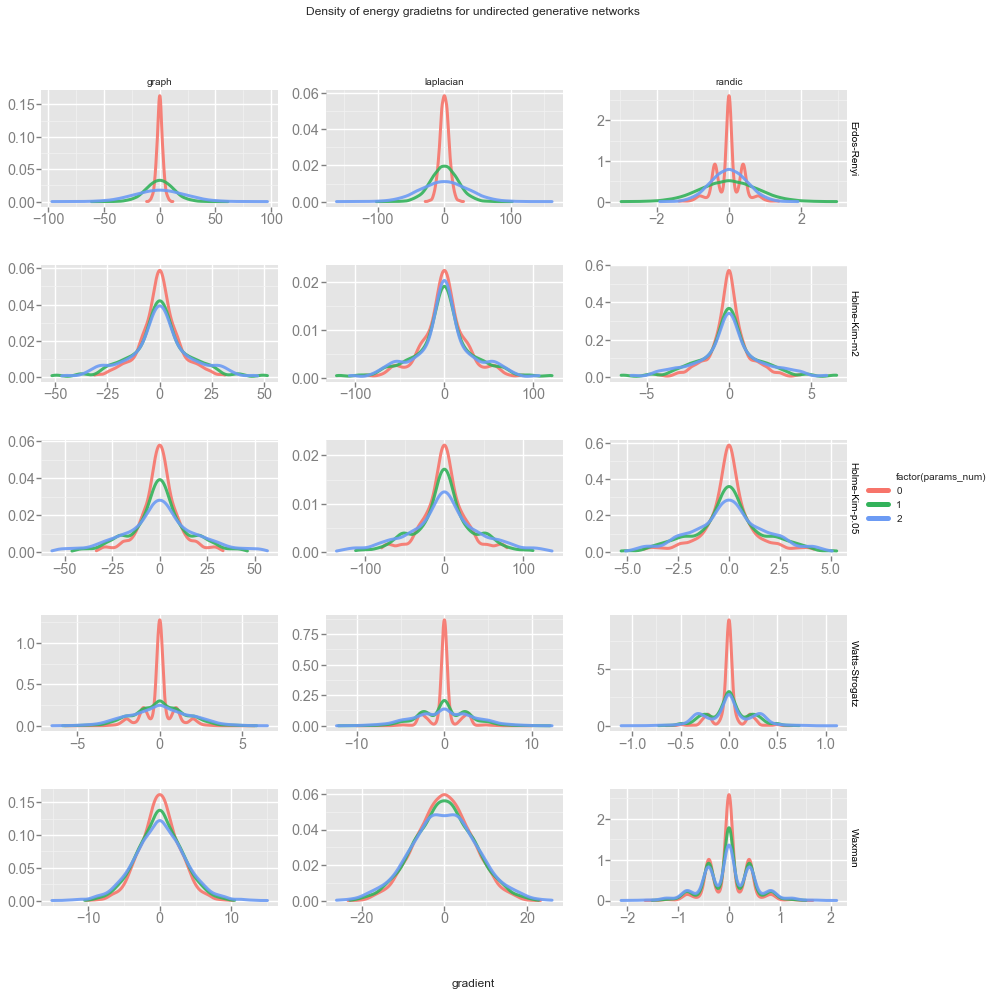

In [278]:
p = ggplot(aes(x='gradient', color='factor(params_num)'), data=flat_gradients_df) + \
geom_density(alpha=0.9, size=3) + \
facet_grid('generator', 'method', scales = "free") + \
ggtitle("Density of energy gradietns for undirected generative networks")
p.save(f'{PLOTS_PATH}energy-gradient-undirected4.pdf', width=16, height=15)

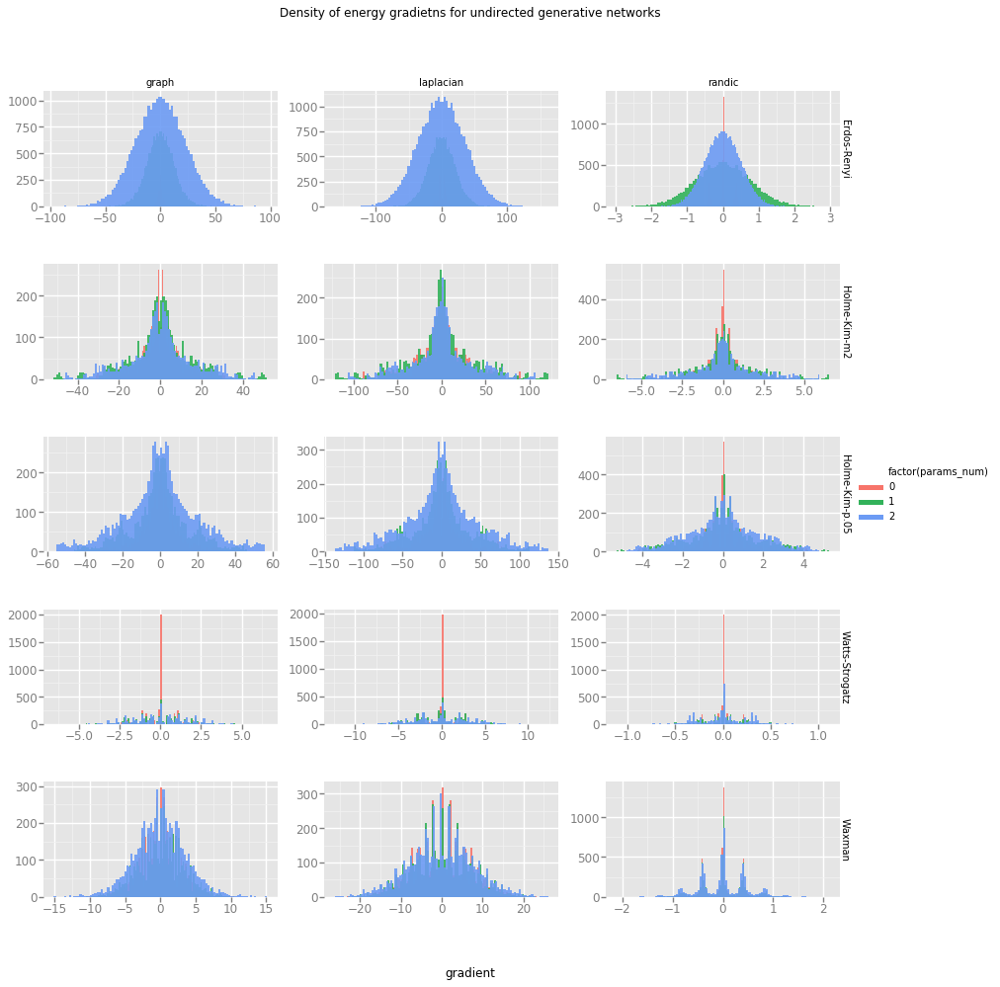

In [203]:
p = ggplot(aes(x='gradient', fill='factor(params_num)'), data=flat_gradients_df) + \
geom_histogram(alpha=0.9, bins=100) + \
facet_grid('generator', 'method', scales = "free") + \
ggtitle("Density of energy gradietns for undirected generative networks")
p.save(f'{PLOTS_PATH}energy-gradient-undirected-hist.pdf', width=16, height=15)

In [235]:
flat_gradients_df.head()

,repeat_no,m,generator,id,g,p,params_num,edge,method,gradient
0,0,NaN,Erdos-Renyi,Erdos-Renyi {'p': 0.05} 0,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.05,0,"(0, 13)",graph,4.489634e+00
1,0,NaN,Erdos-Renyi,Erdos-Renyi {'p': 0.05} 0,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.05,0,"(0, 43)",graph,8.989795e-01
2,0,NaN,Erdos-Renyi,Erdos-Renyi {'p': 0.05} 0,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.05,0,"(0, 83)",graph,4.440892e-16
3,0,NaN,Erdos-Renyi,Erdos-Renyi {'p': 0.05} 0,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.05,0,"(0, 94)",graph,4.721360e-01
4,0,NaN,Erdos-Renyi,Erdos-Renyi {'p': 0.05} 0,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.05,0,"(1, 3)",graph,4.721360e-01


In [289]:
def plot_distributions(data, col, row, title, file_name, hue=None):
    sns.reset_orig()
    sns.set(font_scale=1.3)
    g = sns.FacetGrid(data, col=col, row=row, hue=hue, 
                  sharex=False, sharey=False,
                  height=3, aspect=1.5, legend_out=False, margin_titles=True)
    g = g.map(sns.distplot, "gradient", kde_kws={"lw": 3}).add_legend()
    g.fig.subplots_adjust(top=0.92)
    g.fig.suptitle(title, fontsize=16)
    [plt.setp(ax.texts, text="") for ax in g.axes.flat]
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}')
    g.savefig(f"{PLOTS_PATH}{file_name}")
    return g

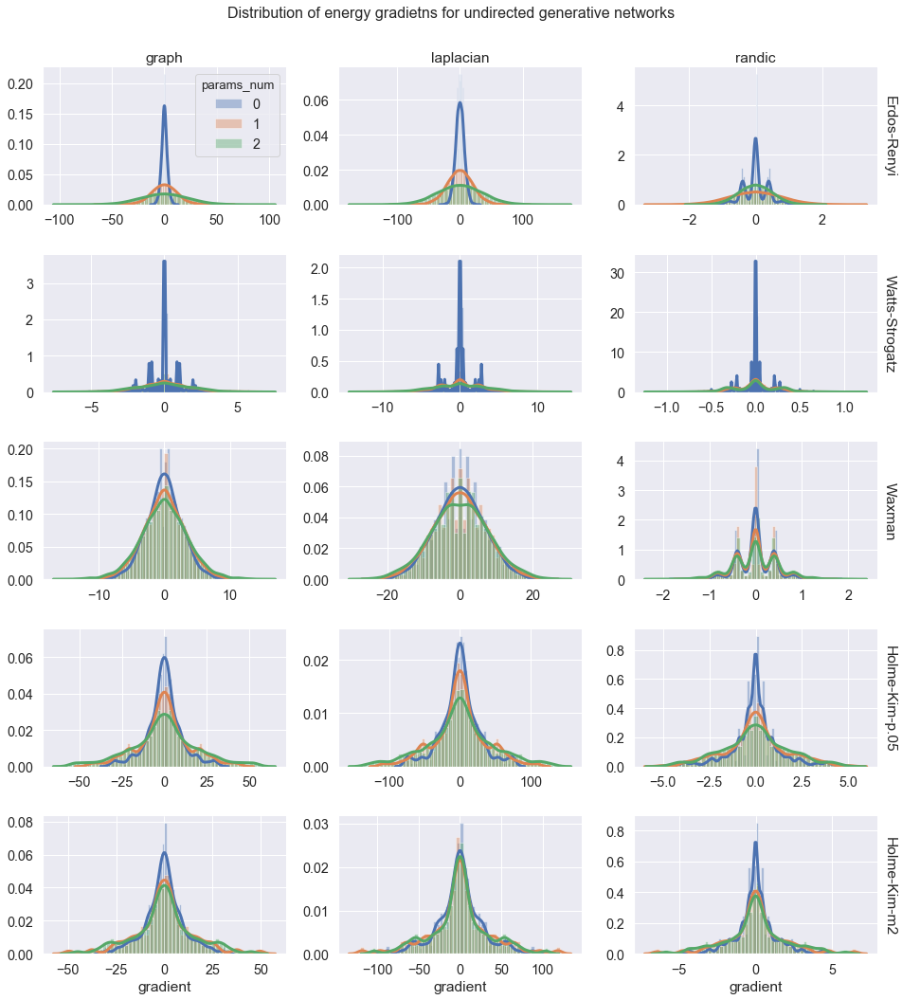

In [290]:
plot_distributions(data=flat_gradients_df, col="method", row="generator", hue="params_num",
                  title="Distribution of energy gradietns for undirected generative networks",
                  file_name="energy-gradient-undirected-dist.pdf")

In [198]:
di_graphs_df = create_graphs(DI_NETWORK_GENERATORS)

di_gradients_df = calculate_gradients(di_graphs_df, METHODS)

di_flat_gradients_df = flatten_gradients_df(di_gradients_df, METHODS)

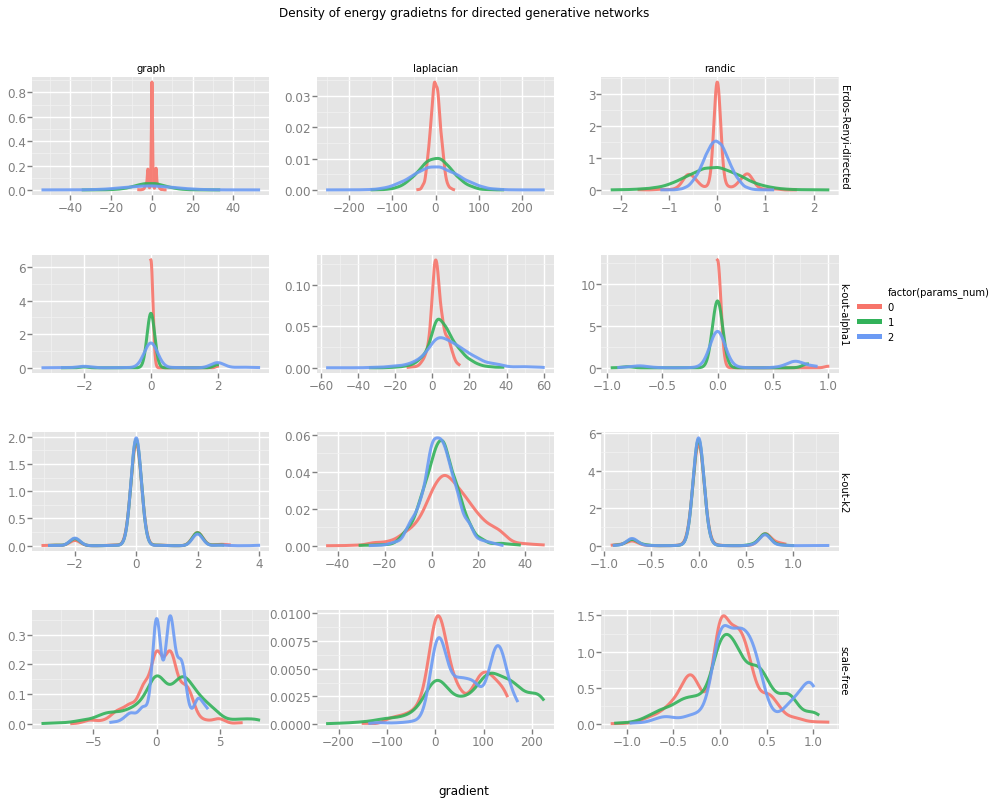

In [199]:
p = ggplot(aes(x='gradient', color='factor(params_num)'), data=di_flat_gradients_df) + \
geom_density(alpha=0.9, size=3) + \
facet_grid('generator', 'method', scales = "free") + \
ggtitle("Density of energy gradietns for directed generative networks")
p.save(f'{PLOTS_PATH}energy-gradient-directed4.pdf', width=16, height=12)

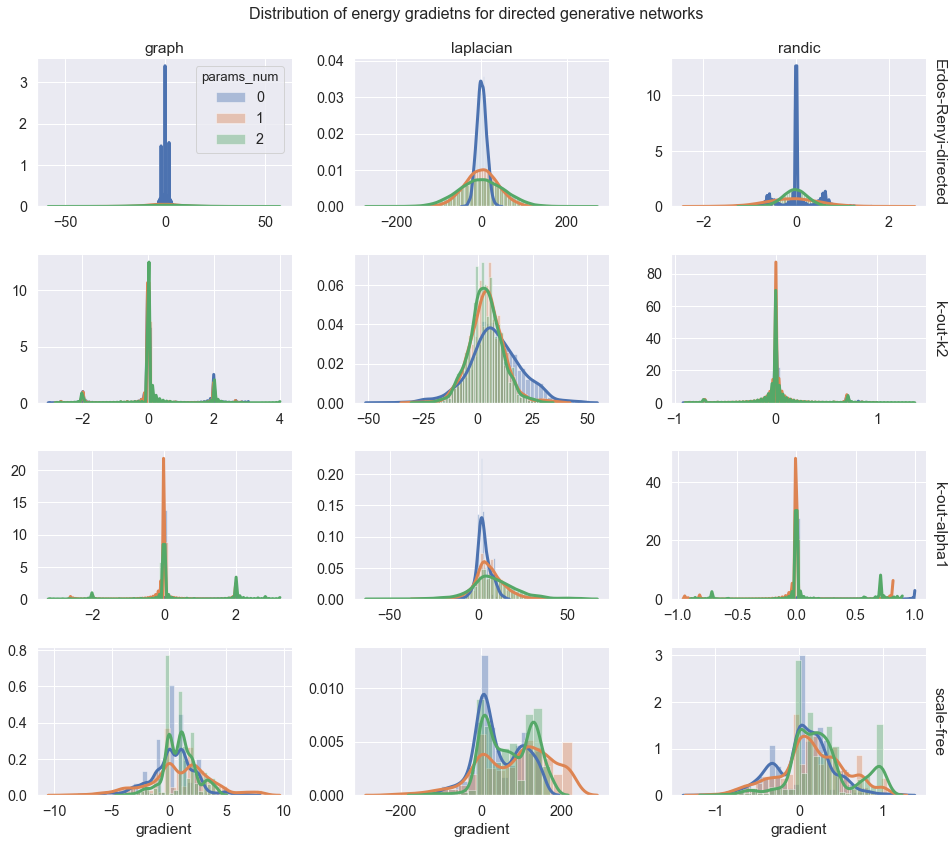

In [291]:
plot_distributions(data=di_flat_gradients_df, col="method", row="generator", hue="params_num",
                  title="Distribution of energy gradietns for directed generative networks",
                  file_name="energy-gradient-directed-dist.pdf")

### Visualization of energy gradients distributions in empirical networks

Directed graphs have been chaged to undirected representation

In [56]:
results = []
for (name, G), method in itertools.product(empirical_networks.items(), methods):
    graph_gradients = list(neg.get_energy_gradients(G, method).values())
    for gradient in graph_gradients:
        results.append((name, method, gradient))

In [57]:
network, method, gradients = map(list, zip(*results))
df = pd.DataFrame({'network': network, 'method': method, 'gradients': gradients})

In [130]:
ggplot(aes(x='gradients'), data=df) + \
geom_density(alpha=0.6, color='#5F9FD3', size=3) + \
facet_grid('network', 'method', scales = "free")

NameError: name 'df' is not defined

In [104]:
datasets = nu.create_datasets('konect.uni')

In [126]:
filtered_datasets = datasets.filter(directed=False, min_size=200, max_size=1500, max_density=0.1)

In [127]:
filtered_datasets.to_df()

,name,category,directed,num_nodes,num_edges,tsv_url
27,arenas-meta,Metabolic,False,453,4596,http://konect.uni-koblenz.de/downloads/tsv/are...
34,tntp-ChicagoRegional,Infrastructure,False,1467,1298,http://konect.uni-koblenz.de/downloads/tsv/tnt...
44,moreno_crime,Interaction,False,1380,1476,http://konect.uni-koblenz.de/downloads/tsv/mor...
75,subelj_euroroad,Infrastructure,False,1174,1417,http://konect.uni-koblenz.de/downloads/tsv/sub...
147,maayan-pdzbase,Metabolic,False,212,244,http://konect.uni-koblenz.de/downloads/tsv/maa...
192,arenas-email,Communication,False,1133,5451,http://konect.uni-koblenz.de/downloads/tsv/are...
193,opsahl-ucforum,Interaction,False,1421,33720,http://konect.uni-koblenz.de/downloads/tsv/ops...
195,unicodelang,Feature,False,868,1255,http://konect.uni-koblenz.de/downloads/tsv/uni...


In [60]:
empirical_networks_df = filtered_datasets.download_and_build_networks().rename(columns={'graph': 'g'})

In [66]:
empirical_networks_df

,name,category,directed,num_nodes,num_edges,tsv_url,g
27,arenas-meta,Metabolic,False,453,4596,http://konect.uni-koblenz.de/downloads/tsv/are...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
34,tntp-ChicagoRegional,Infrastructure,False,1467,1298,http://konect.uni-koblenz.de/downloads/tsv/tnt...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
44,moreno_crime,Interaction,False,1380,1476,http://konect.uni-koblenz.de/downloads/tsv/mor...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
75,subelj_euroroad,Infrastructure,False,1174,1417,http://konect.uni-koblenz.de/downloads/tsv/sub...,"(1, 2, 3, 17, 4, 5, 855, 6, 7, 880, 8, 22, 23,..."
147,maayan-pdzbase,Metabolic,False,212,244,http://konect.uni-koblenz.de/downloads/tsv/maa...,"(1, 180, 2, 114, 137, 3, 107, 121, 149, 164, 1..."
192,arenas-email,Communication,False,1133,5451,http://konect.uni-koblenz.de/downloads/tsv/are...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
193,opsahl-ucforum,Interaction,False,1421,33720,http://konect.uni-koblenz.de/downloads/tsv/ops...,"(1, 1084560796, 2, 1084560848, 3, 1084560940, ..."
195,unicodelang,Feature,False,868,1255,http://konect.uni-koblenz.de/downloads/tsv/uni...,"(31, 18, 1, 221, 28, 0.018, 185, 12, 0, 38, 87..."


In [131]:
empirical_gradients_df = calculate_gradients(empirical_networks_df, METHODS)

In [132]:
empirical_flat_gradients_df = flatten_gradients_df(empirical_gradients_df, METHODS)

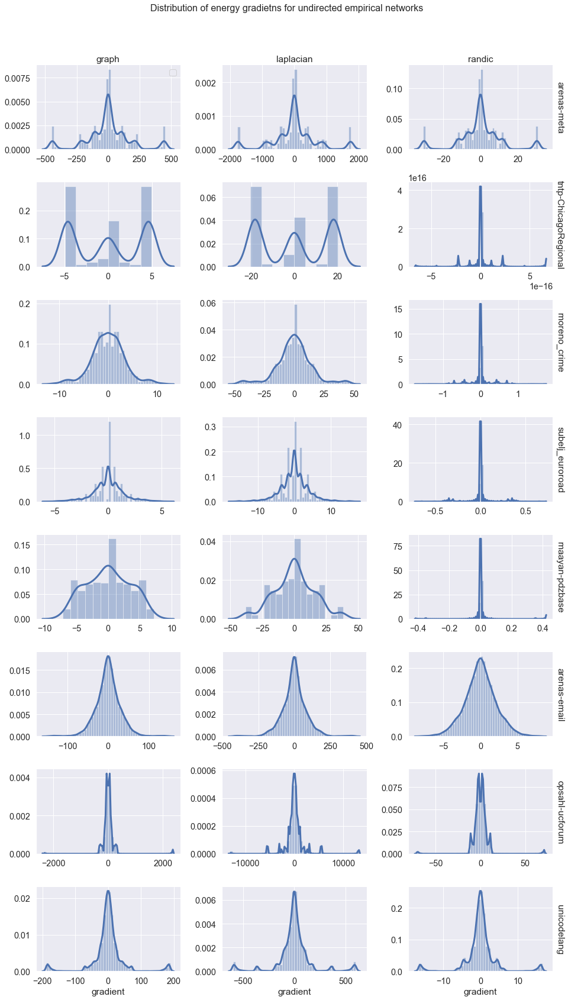

In [292]:
plot_distributions(data=empirical_flat_gradients_df, col="method", row="name",
                  title="Distribution of energy gradietns for undirected empirical networks",
                  file_name="empirical-energy-gradient-dist.pdf")

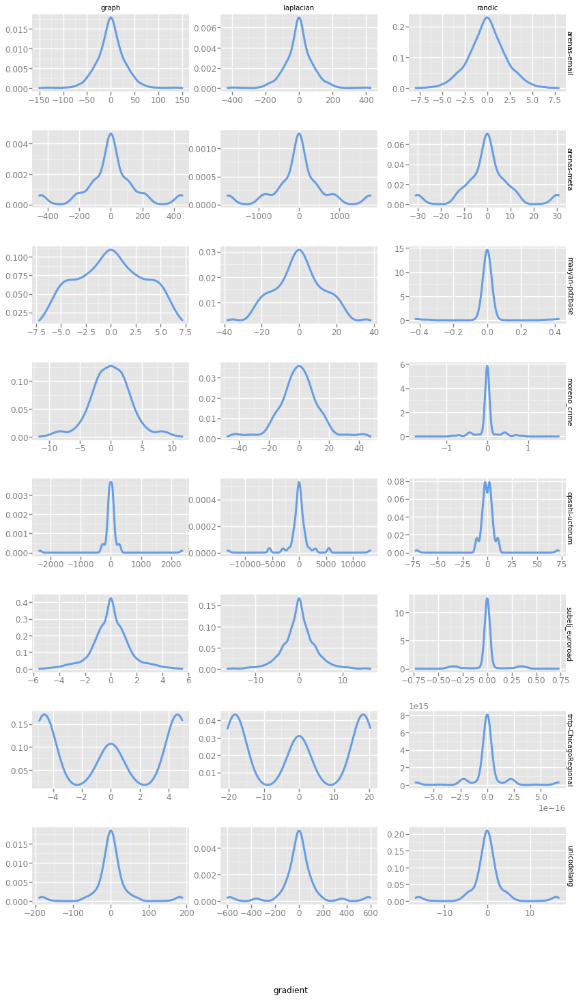

In [178]:
p = ggplot(aes(x='gradient'), data=empirical_flat_gradients_df) + \
geom_density(color='#669DE4', size=3) + \
facet_grid('name', 'method', scales = "free")
p.save(f'{PLOTS_PATH}empirical-energy-gradient.pdf', width=14, height=24)

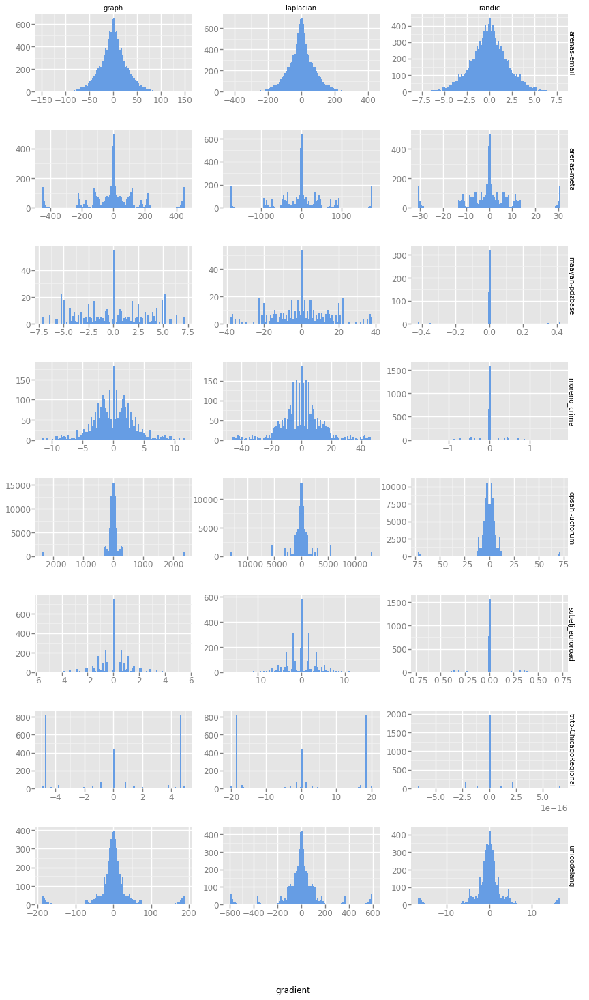

In [204]:
p = ggplot(aes(x='gradient'), data=empirical_flat_gradients_df) + \
geom_histogram(fill='#669DE4', bins=100) + \
facet_grid('name', 'method', scales = "free")
p.save(f'{PLOTS_PATH}empirical-energy-gradient-hist.pdf', width=14, height=24)

In [70]:
di_filtered_datasets = datasets.filter(directed=True, min_size=200, max_size=1500, max_density=0.1)
di_empirical_networks_df = di_filtered_datasets.download_and_build_networks().rename(columns={'graph': 'g'})
di_empirical_gradients_df = calculate_gradients(di_empirical_networks_df, METHODS)
di_empirical_flat_gradients_df = flatten_gradients_df(di_empirical_gradients_df, METHODS)

100% [................................................................................] 8383 / 8383

In [72]:
di_empirical_networks_df

,name,category,directed,num_nodes,num_edges,tsv_url,g
4,maayan-faa,Infrastructure,True,1226,2615,http://konect.uni-koblenz.de/downloads/tsv/maa...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
23,moreno_blogs,Hyperlink,True,1224,19025,http://konect.uni-koblenz.de/downloads/tsv/mor...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
149,moreno_innovation,HumanSocial,True,241,1098,http://konect.uni-koblenz.de/downloads/tsv/mor...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
160,moreno_oz,HumanSocial,True,217,2672,http://konect.uni-koblenz.de/downloads/tsv/mor...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."


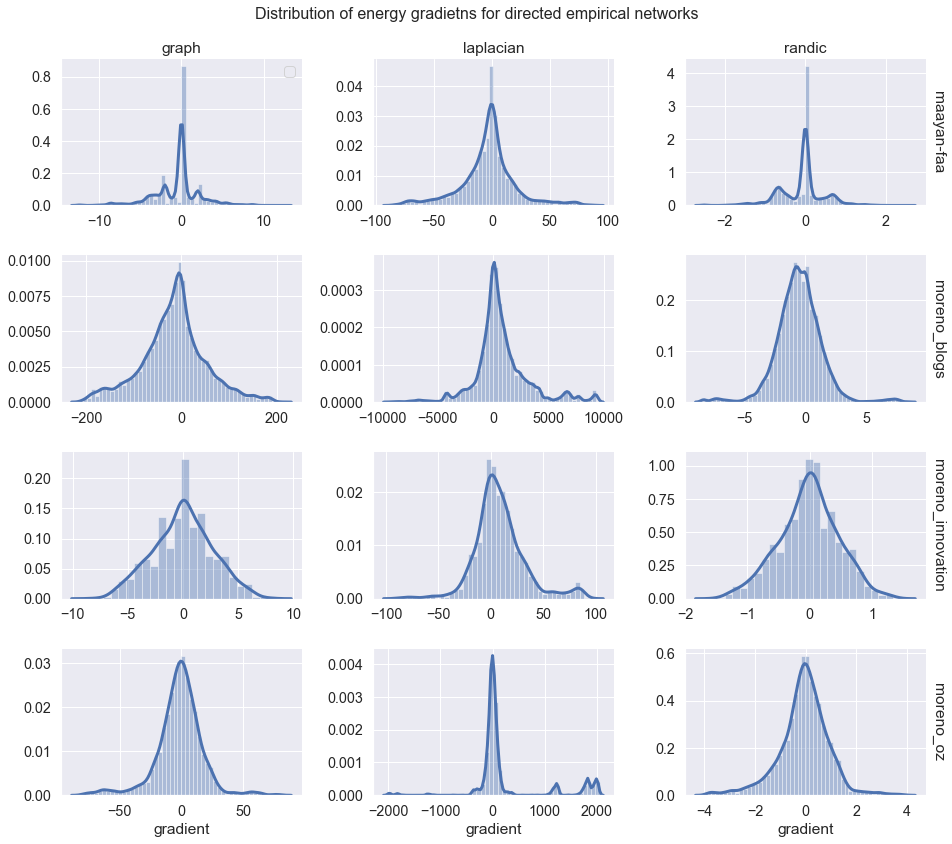

In [293]:
plot_distributions(data=di_empirical_flat_gradients_df, col="method", row="name",
                  title="Distribution of energy gradietns for directed empirical networks",
                  file_name="empirical-directed-energy-gradient-dist.pdf")

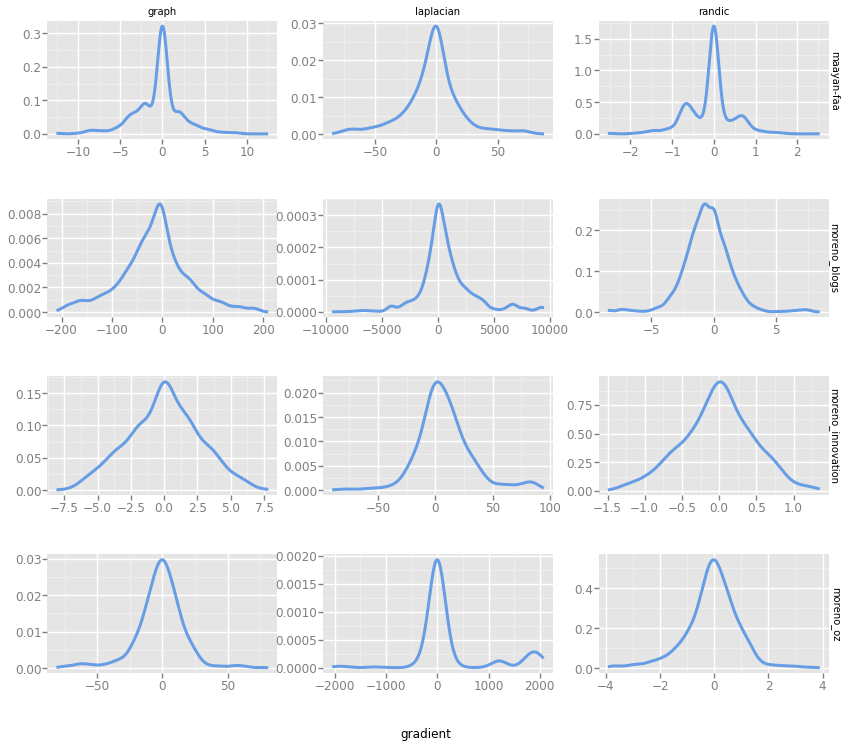

In [179]:
p = ggplot(aes(x='gradient'), data=di_empirical_flat_gradients_df) + \
geom_density(color='#669DE4', size=3) + \
facet_grid('name', 'method', scales = "free")
p.save(f'{PLOTS_PATH}empirical-energy-gradient-directed.pdf', width=14, height=12)

In [162]:
graphs_df.head()

,g,generator,id,p,params_num
0,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",erdos-renyi,erdos-renyi {'p': 0.1},0.1,0
1,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",erdos-renyi,erdos-renyi {'p': 0.4},0.4,1
2,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",erdos-renyi,erdos-renyi {'p': 0.7},0.7,2
3,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",watts-strogatz,watts-strogatz {'p': 0.1},0.1,0
4,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",watts-strogatz,watts-strogatz {'p': 0.4},0.4,1


### Visualization of gradients

In [56]:
DrawDataEntry = namedtuple('DrawDataEntry', 
                           ['p', 'generator', 'method', 'g', 'energies', 'gradients',
                           'min_energy', 'max_energy', 'min_gradient', 'max_gradient'])
    
def normalize_list(lizt, target=1.0):
    min_val = min(lizt)
    if min_val < 0:
        lizt = [v - min_val for v in lizt]
    list_sum = sum(lizt)
    factor = target/list_sum
    return [value*factor for value in lizt]
    
def precompute_draw_data(graphs_df, methods):
    entries = []
    for _, (G, generator, idd, _, p, _) in tqdm(list(graphs_df.iterrows())):
        if G.is_directed():
            G = G.to_undirected()
        neg.get_graph_with_energy_data(G, methods=methods, copy=False)
        for method in methods:
            energies = np.array(list(nx.get_node_attributes(G, f'{method}_energy').values()))
            gradients = np.array([np.abs(g) for g in nx.get_edge_attributes(G, f'{method}_gradient').values()])
#             energies = normalize_list(energies)
#             gradients = normalize_list(gradients)
            entries.append(DrawDataEntry(
                p, generator, method, G, energies, gradients,
                np.min(energies), np.max(energies), 
                np.min(gradients), np.max(gradients)
            ))
    return pd.DataFrame(list(map(lambda e: e._asdict(), entries)))     
        
def get_vmin_vmax(df, p, method, generator, attr, vstrategy=""):
    strategies = vstrategy.split('+')
    vp_values, vmethods, vgenerators = list(df['p'].unique()), list(df['method'].unique()), list(df['generator'].unique())
    if 'p' in strategies:
        vp_values = [p]
    if 'method' in strategies:
        vmethods = [method]
    if 'generator' in strategies:
        vgenerators = [generator]
            
    filtered_df = df.query("p in @vp_values and method in @vmethods and generator in @vgenerators")
    
    min_value = filtered_df[f'min_{attr}'].min()
    max_value = filtered_df[f'max_{attr}'].max()
    
    return min_value, max_value

def get_vmin_vmax_energy(df, p, generator, method, vstrategy):
    return get_vmin_vmax(df=df, p=p, generator=generator, method=method, attr='energy', vstrategy=vstrategy)

def get_vmin_vmax_gradient(df, p, generator, method, vstrategy):
    return get_vmin_vmax(df=df, p=p, generator=generator, method=method, attr='gradient', vstrategy=vstrategy)
    
def draw_network(draw_df, p, generator, method, vstrategy='', vstrategy_gradient=''):
    vmin, vmax = get_vmin_vmax_energy(df=draw_df, p=p, generator=generator, method=method, vstrategy=vstrategy)
    edge_vmin, edge_vmax = get_vmin_vmax_gradient(df=draw_df, p=p, generator=generator, method=method, vstrategy=vstrategy_gradient)
    G, energies, gradients = list(draw_df.query("p == @p and generator == @generator and method == @method")\
                    .loc[:,['g', 'energies', 'gradients']].iloc[0])        
    pos = nx.layout.kamada_kawai_layout(G)
    plt.figure(figsize=(18,12))
    nodes = nx.draw_networkx_nodes(G, pos, node_size=[e*40 for e in energies], node_color=energies, cmap=plt.cm.coolwarm, 
                                   vmin=vmin, vmax=vmax, with_labels=False)
    edges = nx.draw_networkx_edges(G, pos, edge_vmin=edge_vmin, edge_vmax=edge_vmax, 
                                   edge_color=gradients, edge_cmap=plt.cm.Reds, width=2, with_labels=False)
    edges_cbar = plt.colorbar(edges)
    edges_cbar.ax.set_title('gradient')
    nodes_cbar = plt.colorbar(nodes)
    nodes_cbar.ax.set_title('energy')
    plt.title('Generator: {}, Method: {}, p: {}'.format(generator, method, p))
    plt.axis('off')
    plt.show()

### Visualization of graph energy and graph energy gradients in sythetic networks

Graphs for every energy computiong method share common colorbars. It can be easilty changed using parameter vstrategy.
For example value: `'p+method+genrator'` would result in separete colorbar for every plot
and value: `p+generator` would result in sharing colorbars between plots with same generator

In [57]:
def draw_graphs(graphs_df, methods, p, vstrategy, vstrategy_gradient, sort_by=None):
    draw_df = precompute_draw_data(graphs_df[graphs_df['repeat_no'] == 0], methods=methods)
    draw_df = draw_df[draw_df['p'] == p]
    if sort_by:
        draw_df = draw_df.sort_values(sort_by)
    for _, (generator, method) in draw_df.loc[:, ['generator', 'method']].iterrows():
        draw_network(draw_df, p, generator, method, vstrategy, vstrategy_gradient)

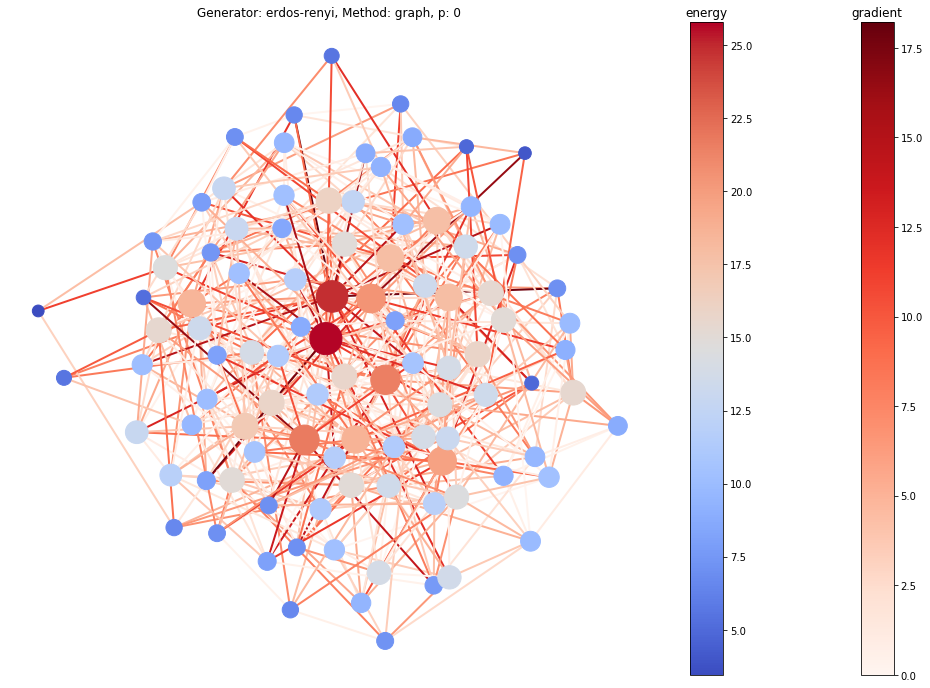

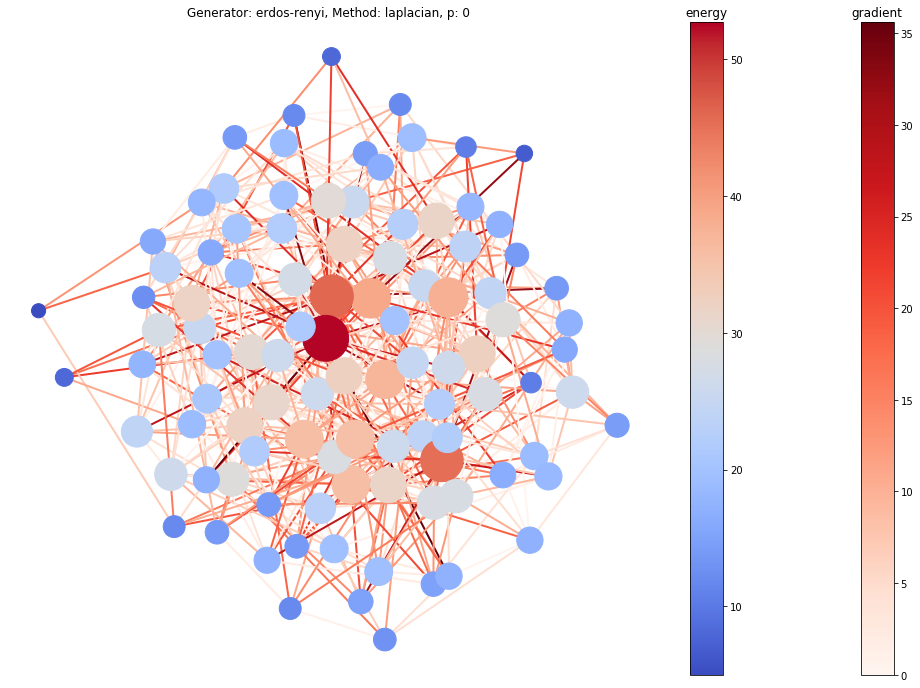

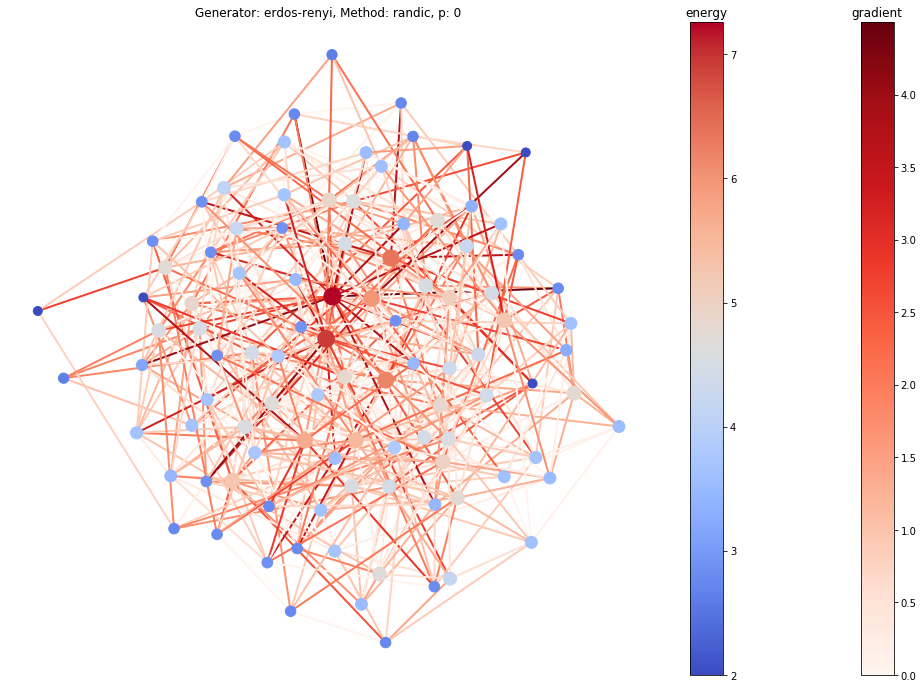

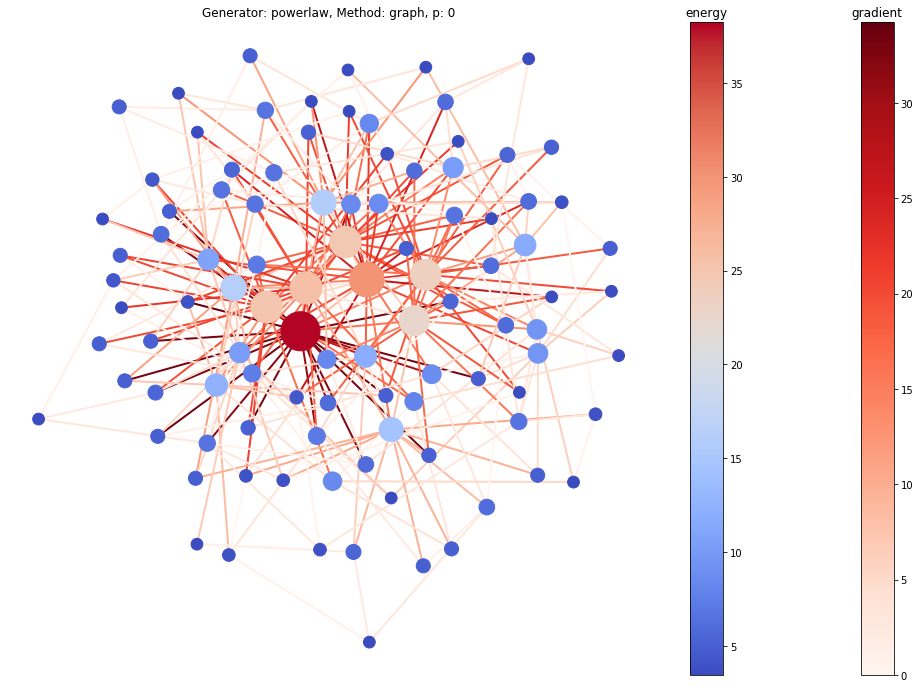

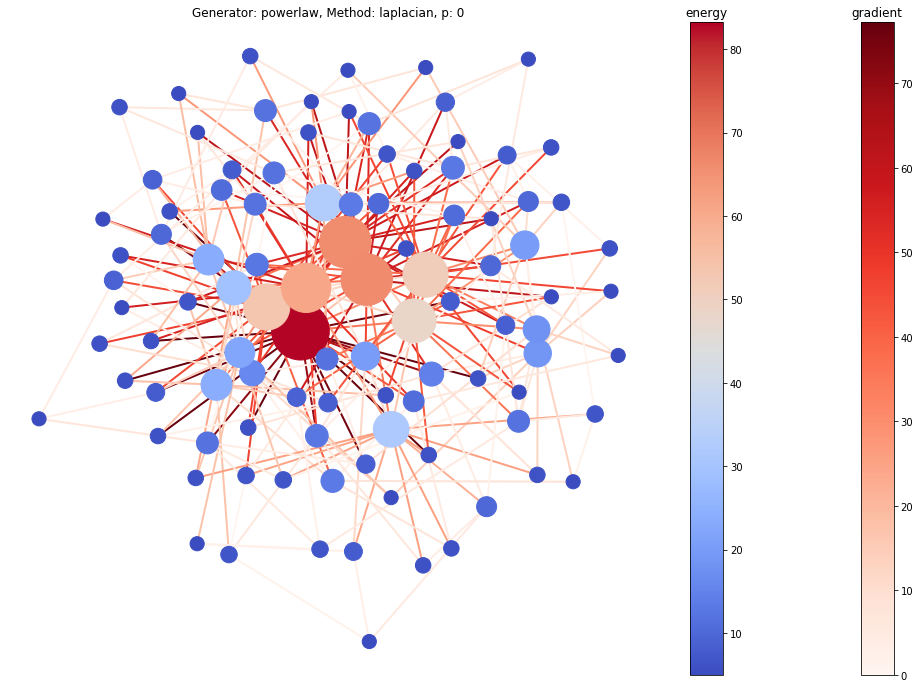

...

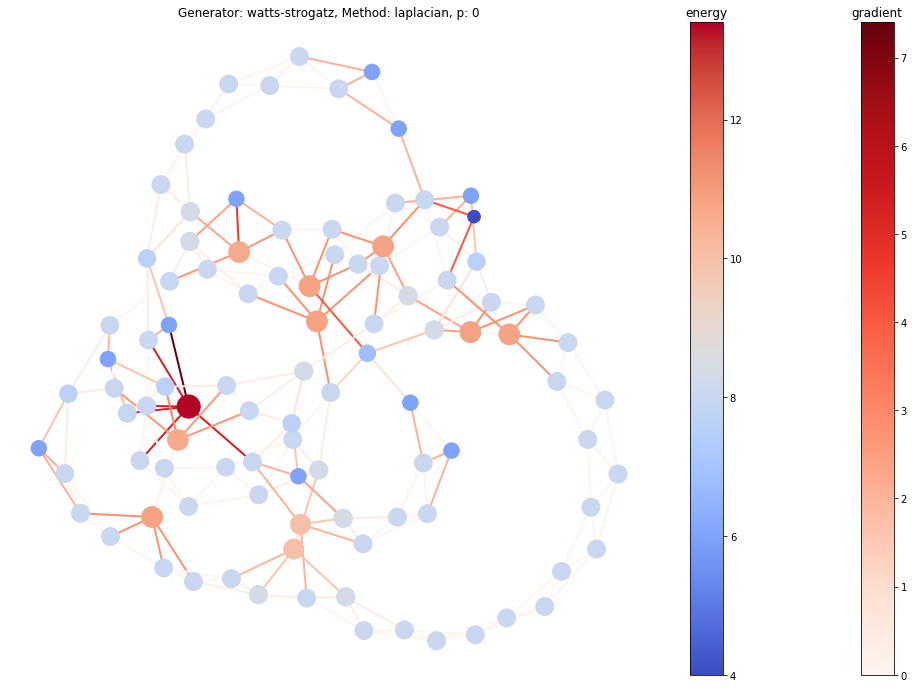

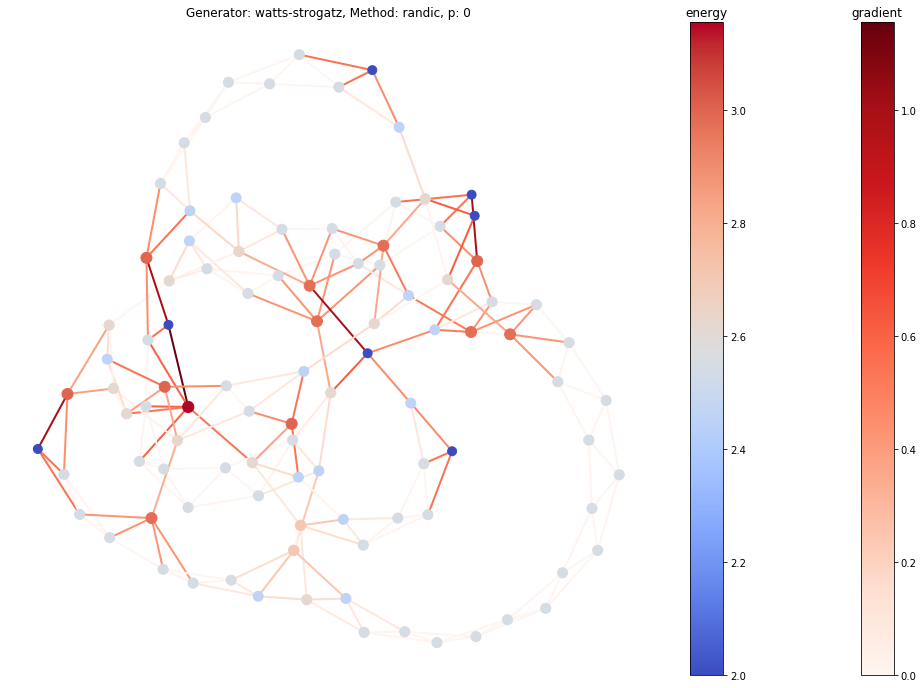

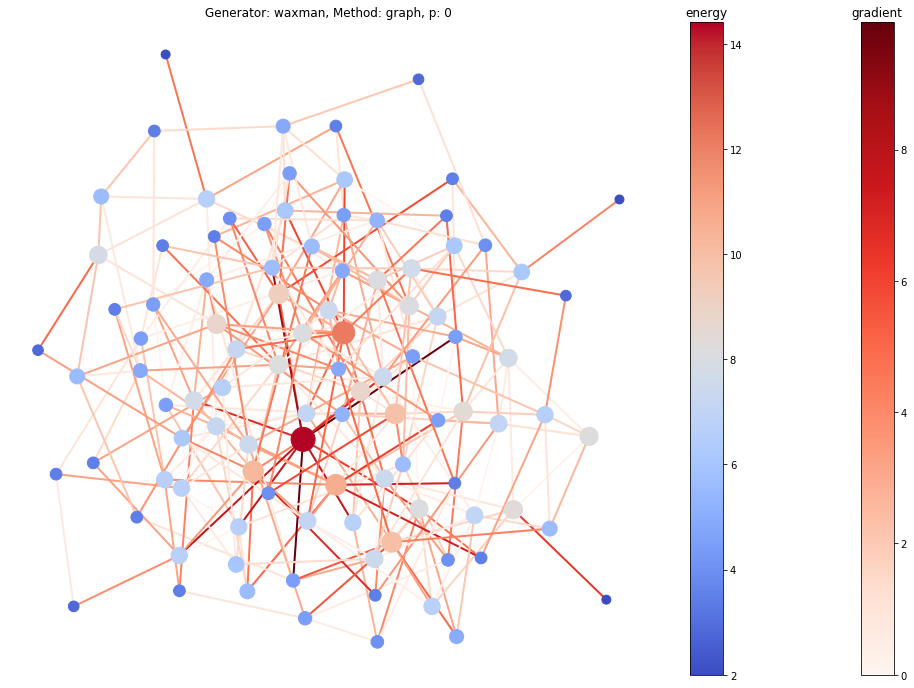

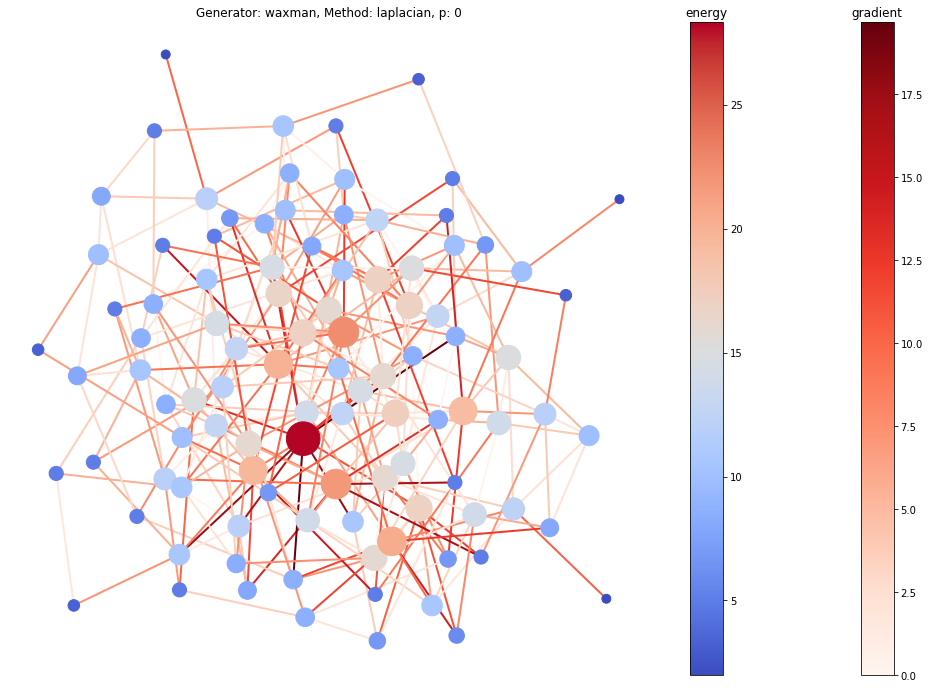

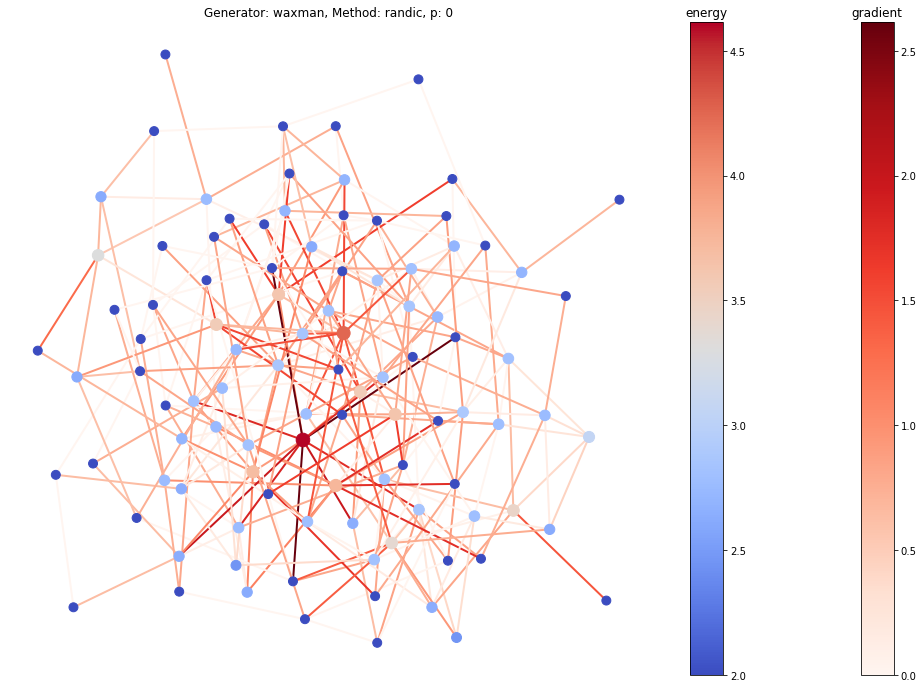

In [47]:
draw_graphs(graphs_df, METHODS, 0, 'p+method+generator', 'p+method+generator', sort_by='generator')

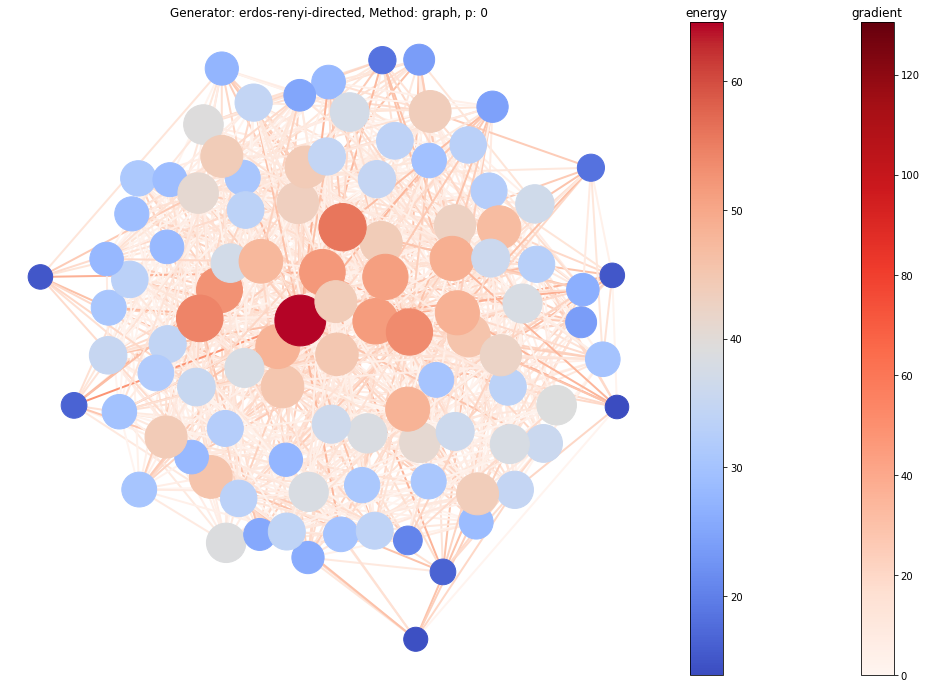

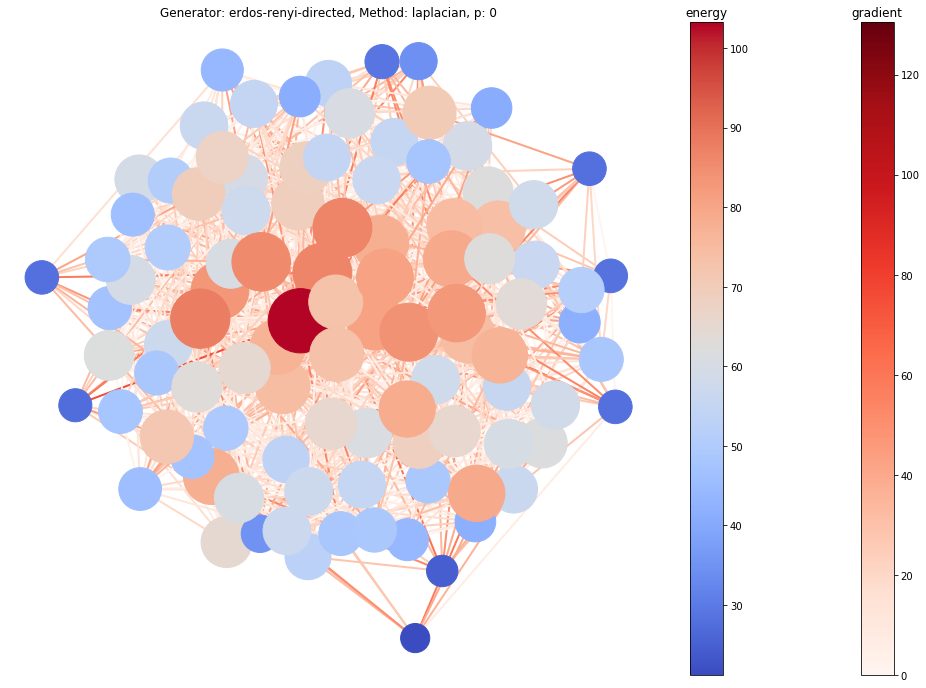

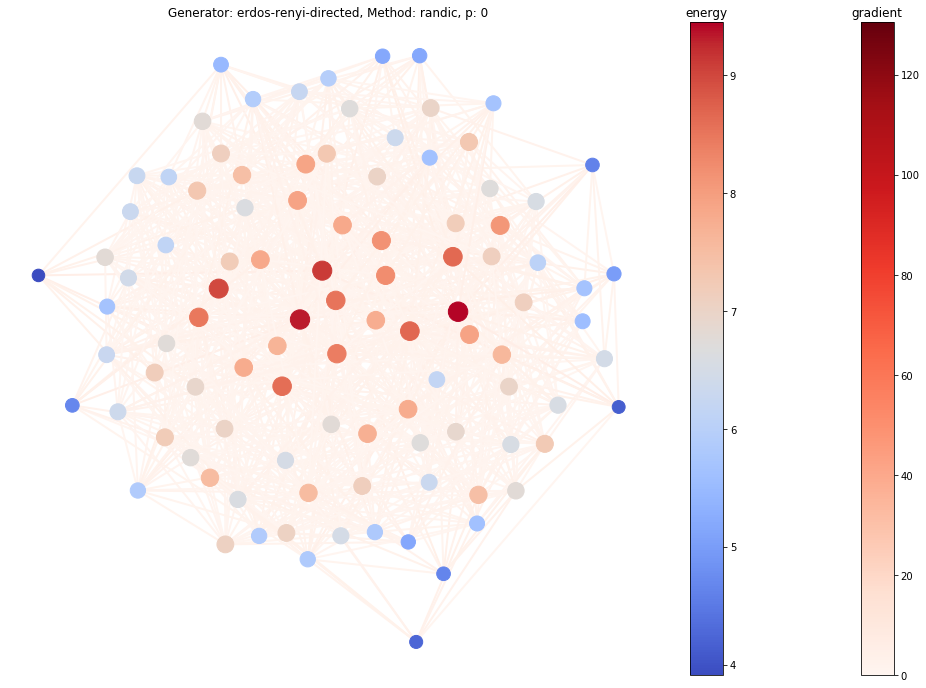

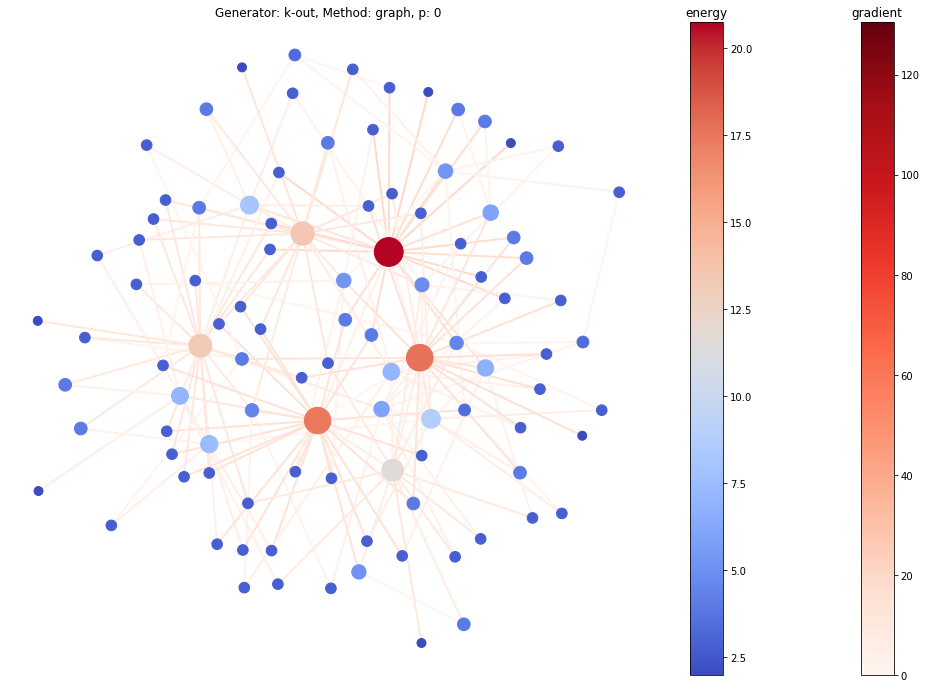

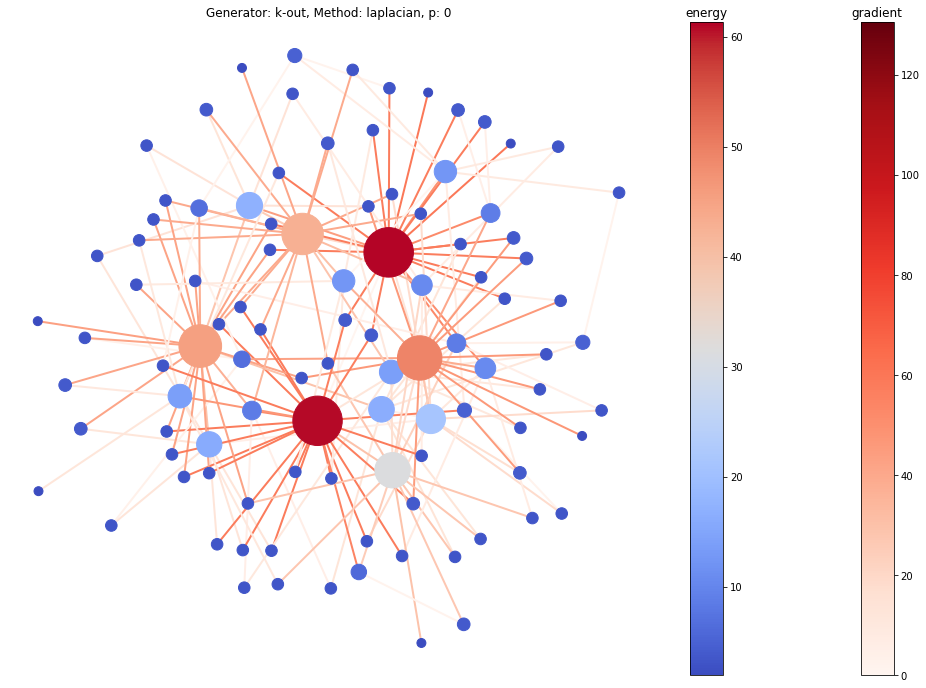

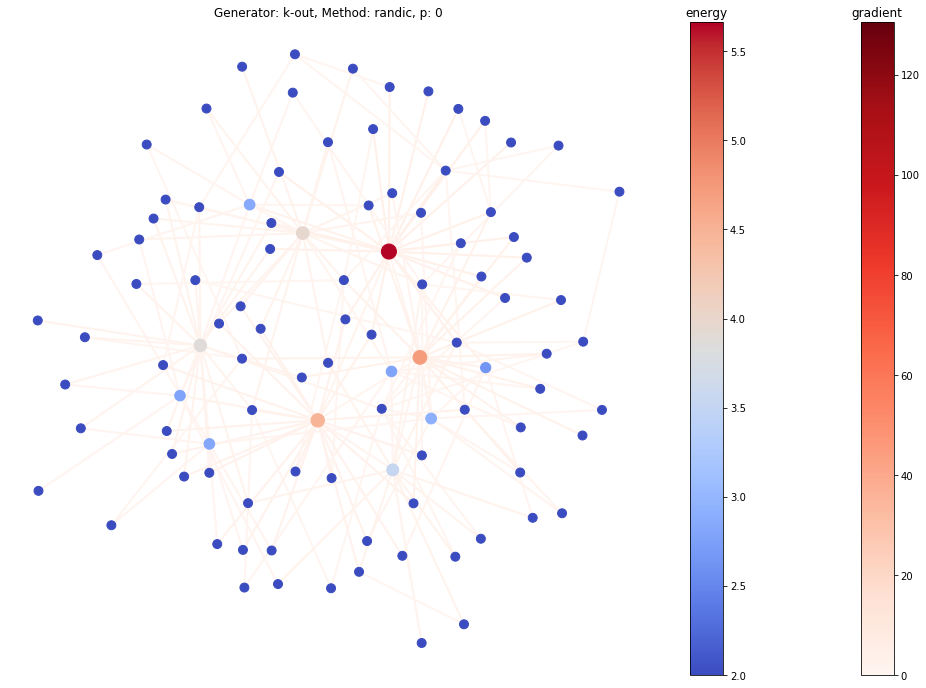

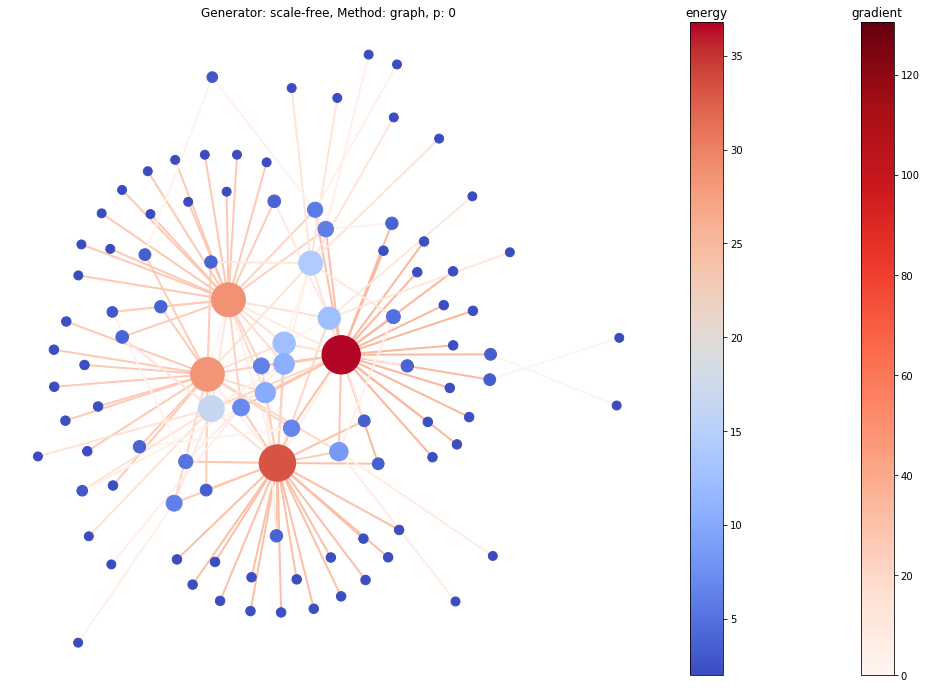

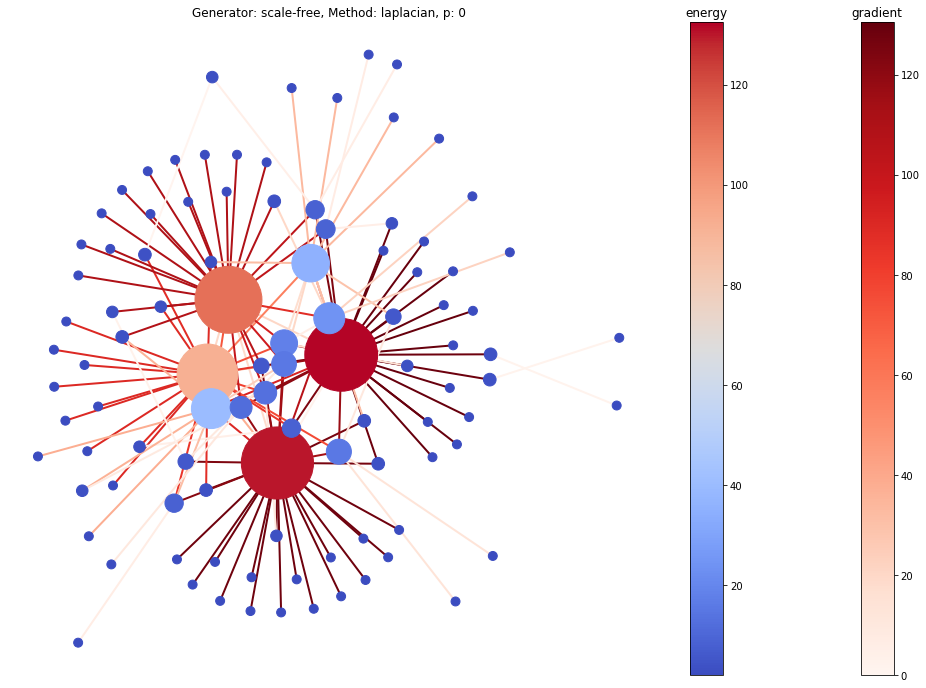

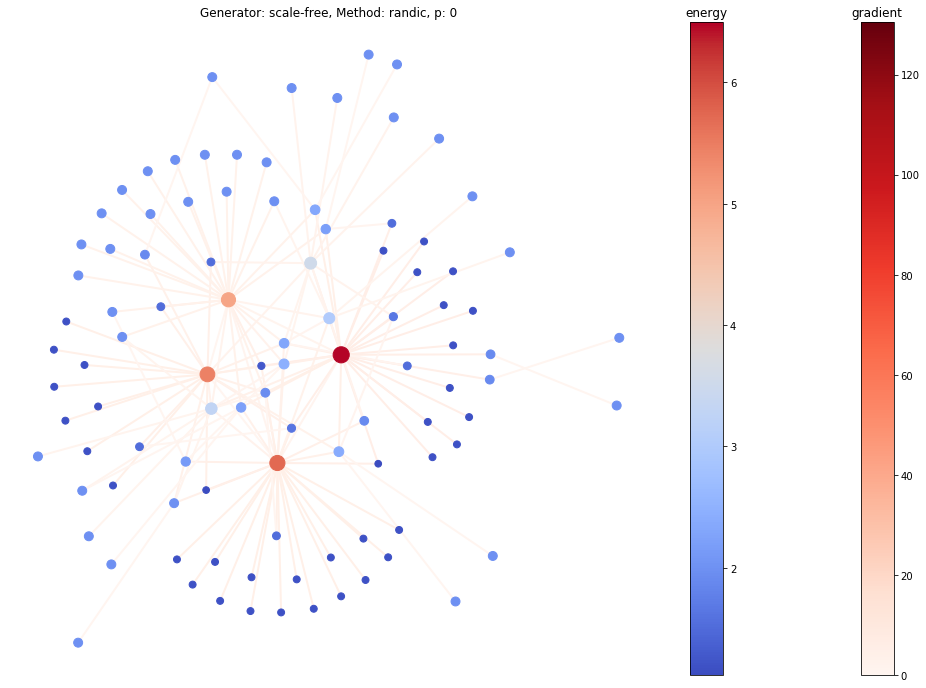

In [61]:
draw_graphs(di_graphs_df, p=0, methods=METHODS, vstrategy='p+method+generator', vstrategy_gradient='p')

### Visualization of gradients of empirical networks

Every graph has independent colorbar. It can be changes using parameter `vstrategy`

In [410]:
num_random_nodes=100
empirical_networks_with_data = {}
empirical_min_energies = {}
empirical_max_energies = {}
empirical_min_gradients = {}
empirical_max_gradients = {}

for network, G in empirical_networks.items():
    random_nodes = random.choices(list(G.nodes()), k=num_random_nodes)
    G = nx.Graph(G.subgraph(random_nodes))
    neg.get_graph_with_energy_data(G, methods=methods, copy=False)
    for method in methods:
        energies = np.array(list(nx.get_node_attributes(G, '{}_energy'.format(method)).values()))
        gradients = np.array([np.abs(g) for g in nx.get_edge_attributes(G, '{}_gradient'.format(method)).values()])
        empirical_networks_with_data[(network, method)] = (energies, gradients, G)
        empirical_min_energies[(network, method)] = np.min(energies)
        empirical_max_energies[(network, method)] = np.max(energies)
        empirical_min_gradients[(network, method)] = np.min(gradients)
        empirical_max_gradients[(network, method)] = np.max(gradients)
        
def empirical_get_vmin_vmax(min_dict, max_dict, vstrategy, network, method):
    strategies = vstrategy.split('+')
    empirical_networks_names = list(empirical_networks.keys())
    vnetworks, vmethods = empirical_networks_names, methods
    if 'network' in strategies:
        vnetworks = [network]
    if 'method' in strategies:
        vmethods = [method]
        
    min_value = float_info.max
    max_value = float_info.min
    for n, m in itertools.product(empirical_networks_names, methods):
        if n in vnetworks and m in vmethods:
            if min_dict[(n, m)] < min_value:
                min_value = min_dict[(n, m)]
            if max_dict[(n, m)] > max_value:
                max_value = max_dict[(n, m)]
    return min_value, max_value

def empirical_get_vmin_vmax_energy(vstrategy, network, method):
    return empirical_get_vmin_vmax(empirical_min_energies, empirical_max_energies, vstrategy, network, method)

def empirical_get_vmin_vmax_gradient(vstrategy,  network, method):
    return empirical_get_vmin_vmax(empirical_min_gradients, empirical_max_gradients, vstrategy, network, method)

def empirical_draw_network(network, method, vstrategy=''):
    vmin, vmax = empirical_get_vmin_vmax_energy(vstrategy, network, method)
    edge_vmin, edge_vmax = empirical_get_vmin_vmax_gradient(vstrategy, network, method)
    energies, gradients, G = empirical_networks_with_data[(network, method)]
    pos = nx.layout.kamada_kawai_layout(G)
    plt.figure(figsize=(18,12))
    nodes = nx.draw_networkx_nodes(G, pos, node_color=energies, cmap=plt.cm.coolwarm, 
                                   vmin=vmin, vmax=vmax, with_labels=False)
    edges = nx.draw_networkx_edges(G, pos, edge_vmin=edge_vmin, edge_vmax=edge_vmax, 
                                   edge_color=gradients, edge_cmap=plt.cm.Reds, width=2, with_labels=False)
    edges_cbar = plt.colorbar(edges)
    edges_cbar.ax.set_title('gradient')
    nodes_cbar = plt.colorbar(nodes)
    nodes_cbar.ax.set_title('energy')
    plt.title('Network: {}, Method: {}'.format(network, method))
    plt.axis('off')
    plt.show()

NameError: name 'empirical_networks' is not defined

In [175]:
empirical_networks.keys()

dict_keys(['python_dependency', 'R_dependency', 'st_mark_ecosystem', 'celegans', 'cat_brain'])

### Visualization of graph energies and graph gradients

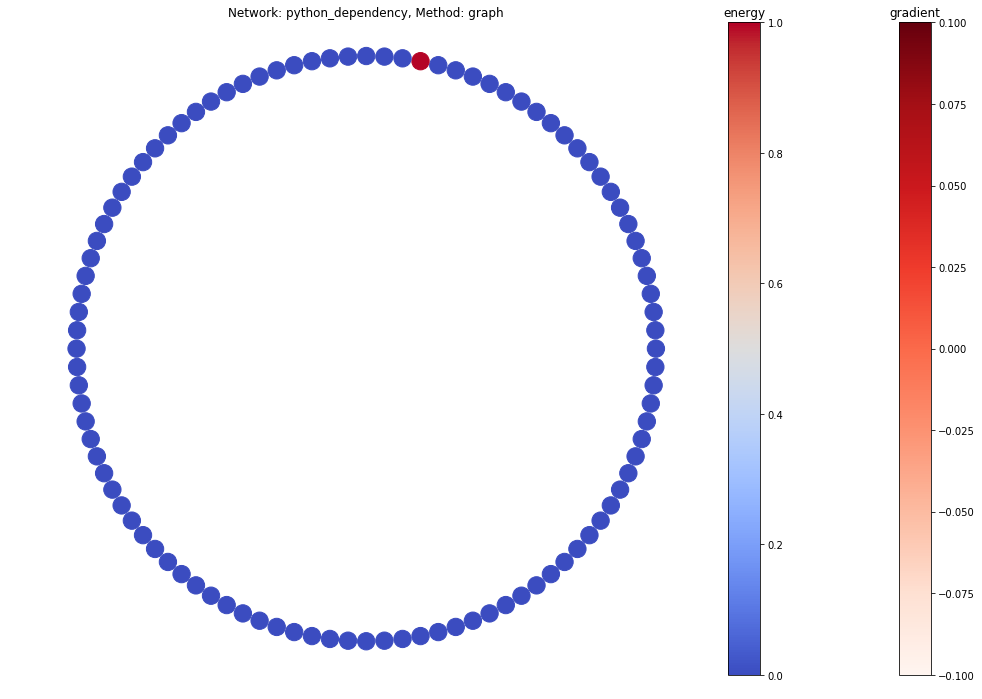

In [176]:
empirical_draw_network('python_dependency', 'graph', vstrategy='method+network')

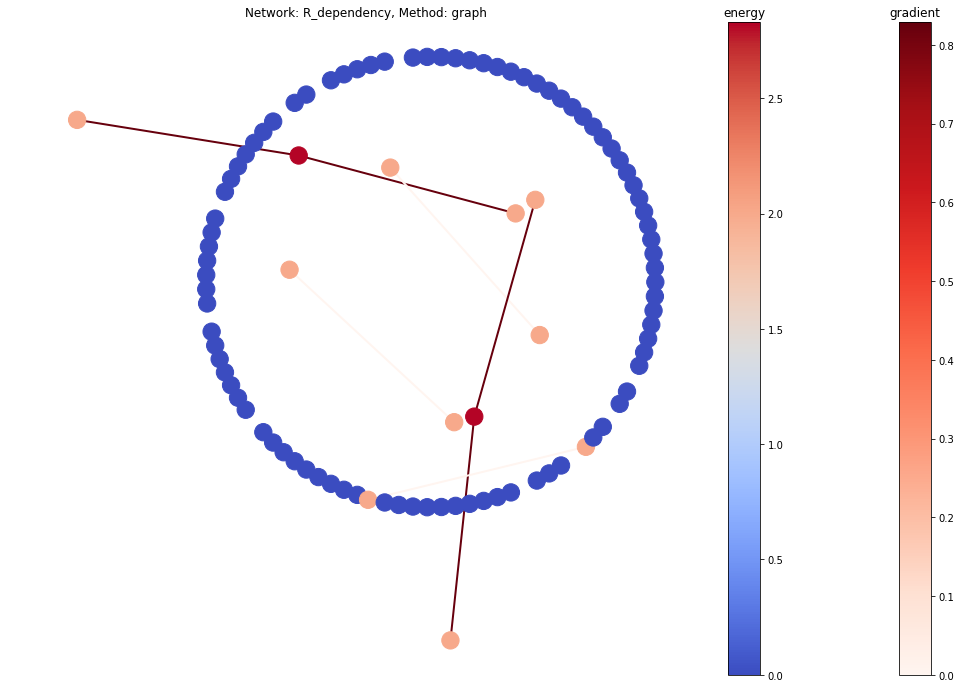

In [177]:
empirical_draw_network('R_dependency', 'graph', vstrategy='method+network')

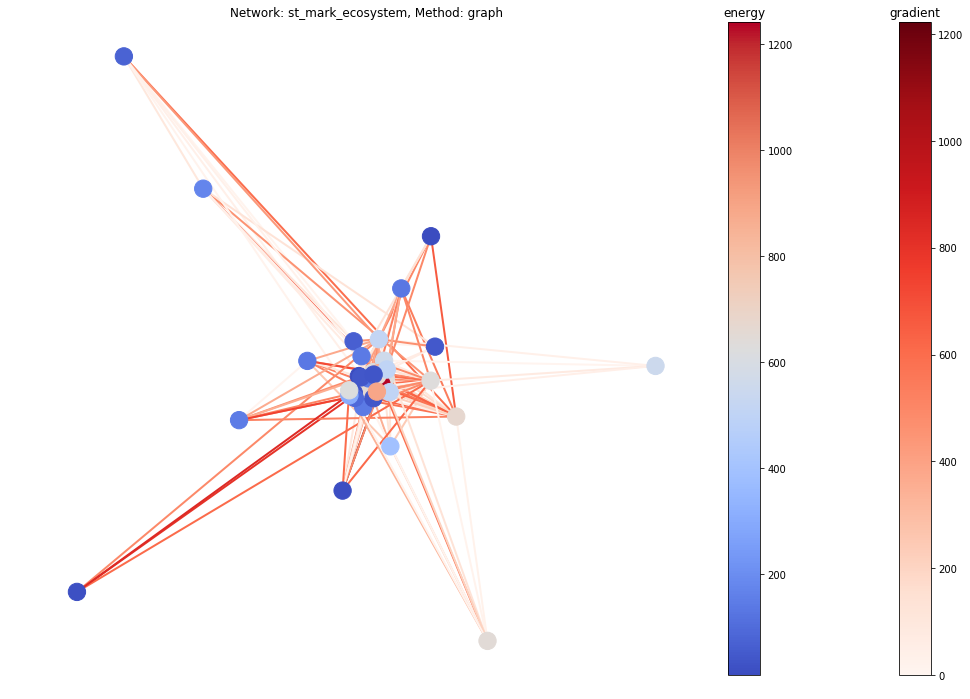

In [178]:
empirical_draw_network('st_mark_ecosystem', 'graph', vstrategy='method+network')

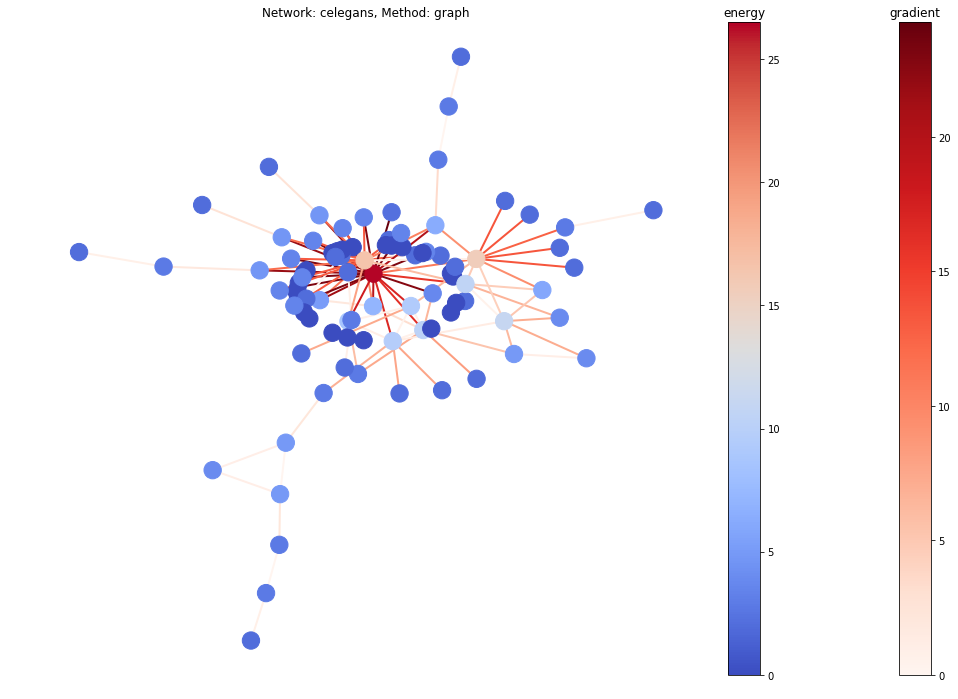

In [179]:
empirical_draw_network('celegans', 'graph', vstrategy='method+network')

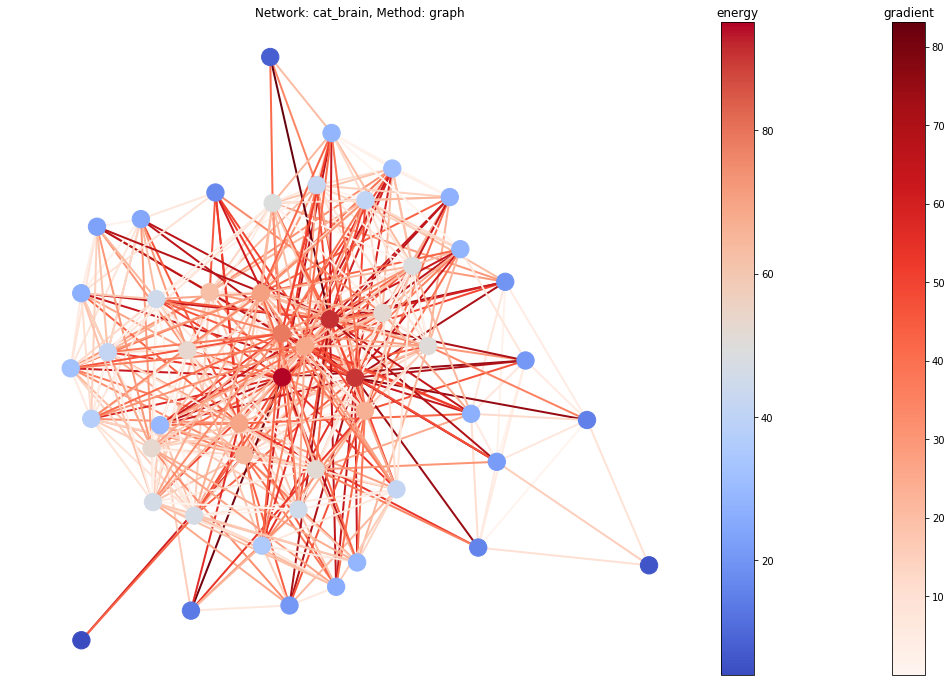

In [180]:
empirical_draw_network('cat_brain', 'graph', vstrategy='method+network')

### Visualization of laplacian energies and laplacian gradients

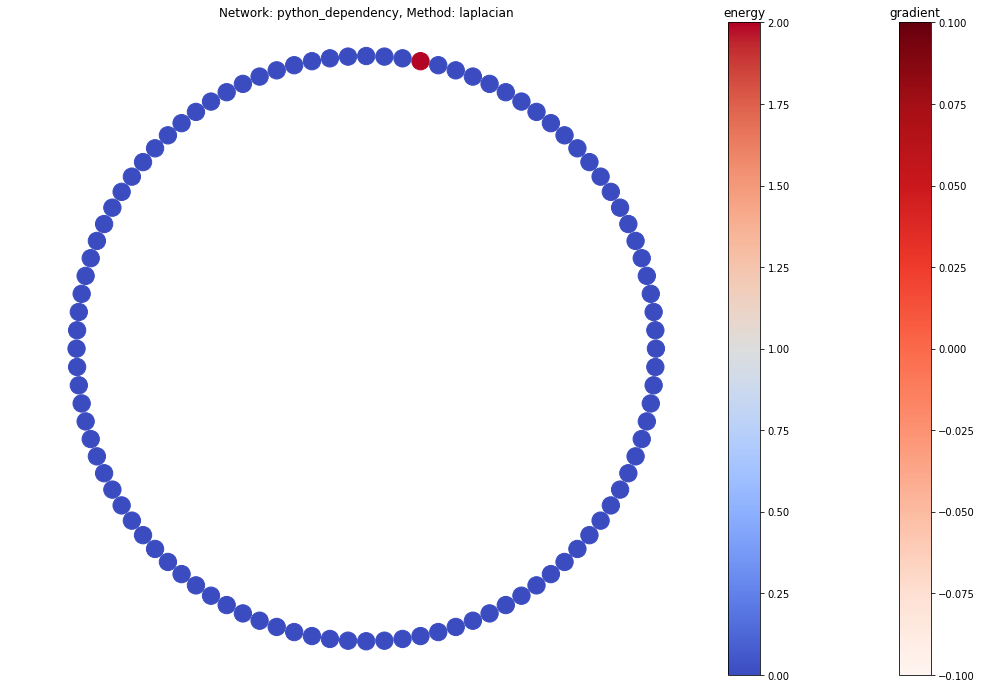

In [181]:
empirical_draw_network('python_dependency', 'laplacian', vstrategy='method+network')

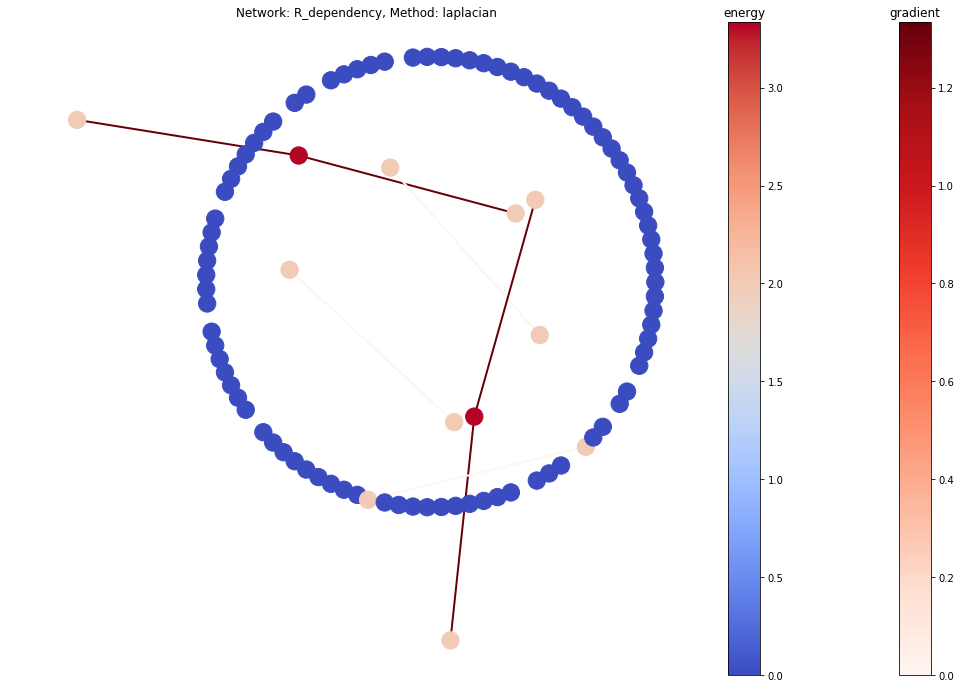

In [182]:
empirical_draw_network('R_dependency', 'laplacian', vstrategy='method+network')

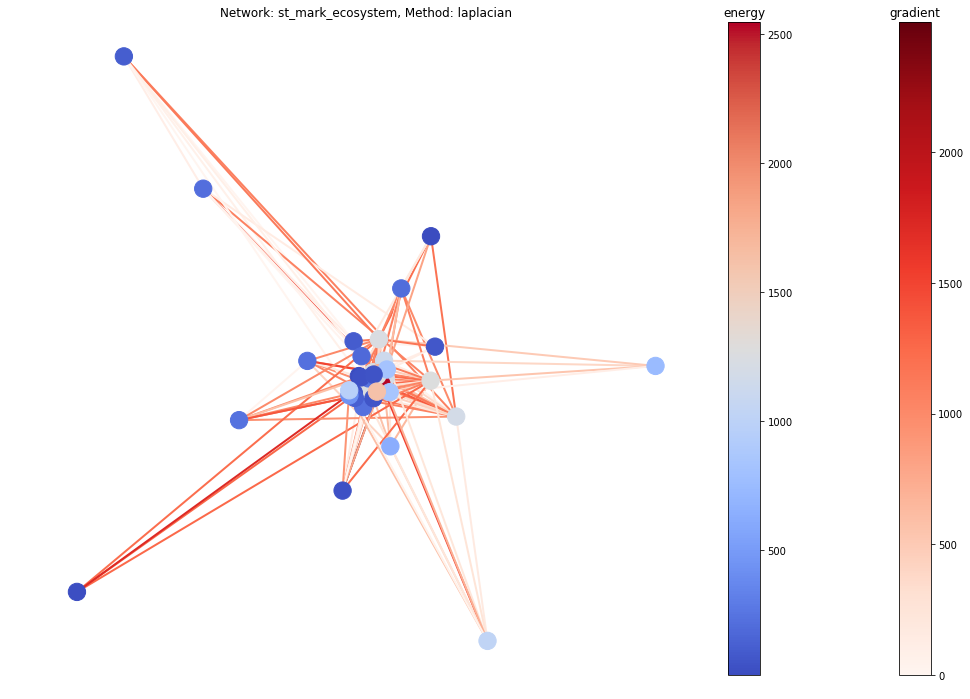

In [184]:
empirical_draw_network('st_mark_ecosystem', 'laplacian', vstrategy='method+network')

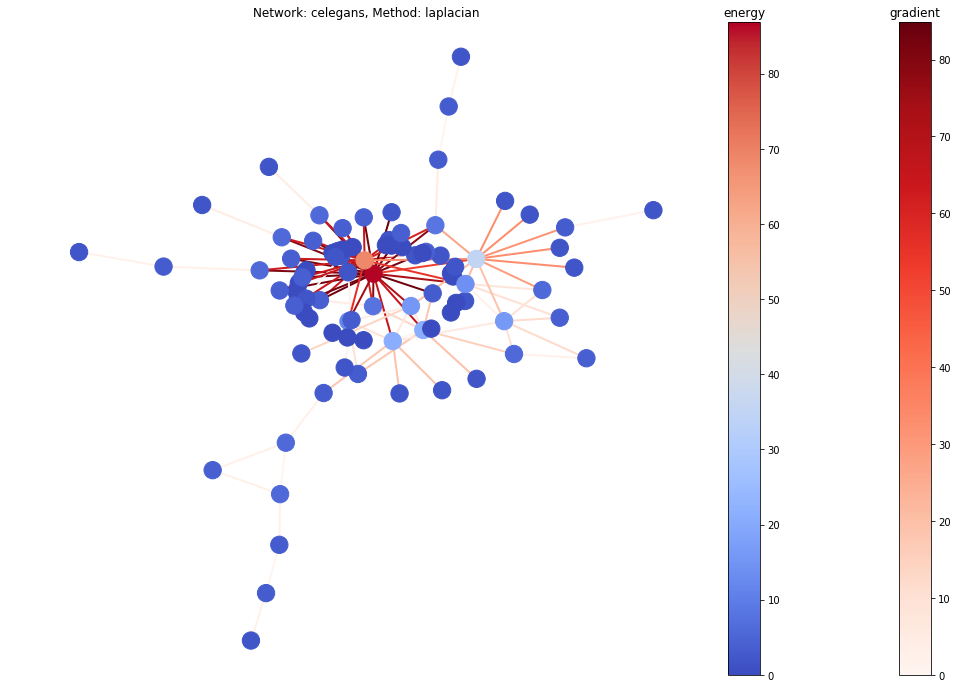

In [185]:
empirical_draw_network('celegans', 'laplacian', vstrategy='method+network')

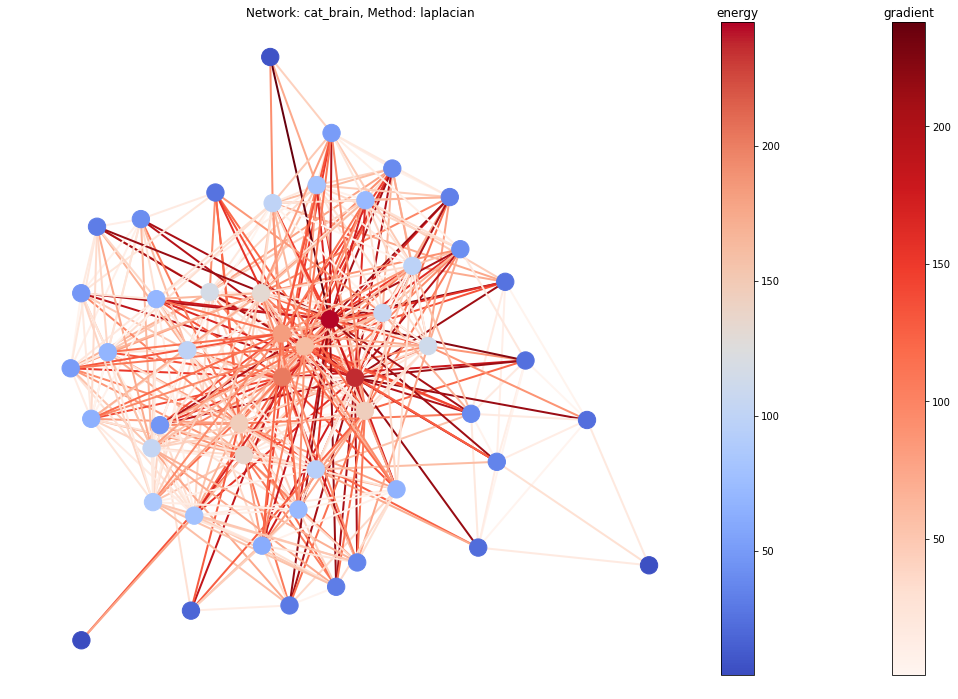

In [186]:
empirical_draw_network('cat_brain', 'laplacian', vstrategy='method+network')

### Visualization of randic energies and randic gradients

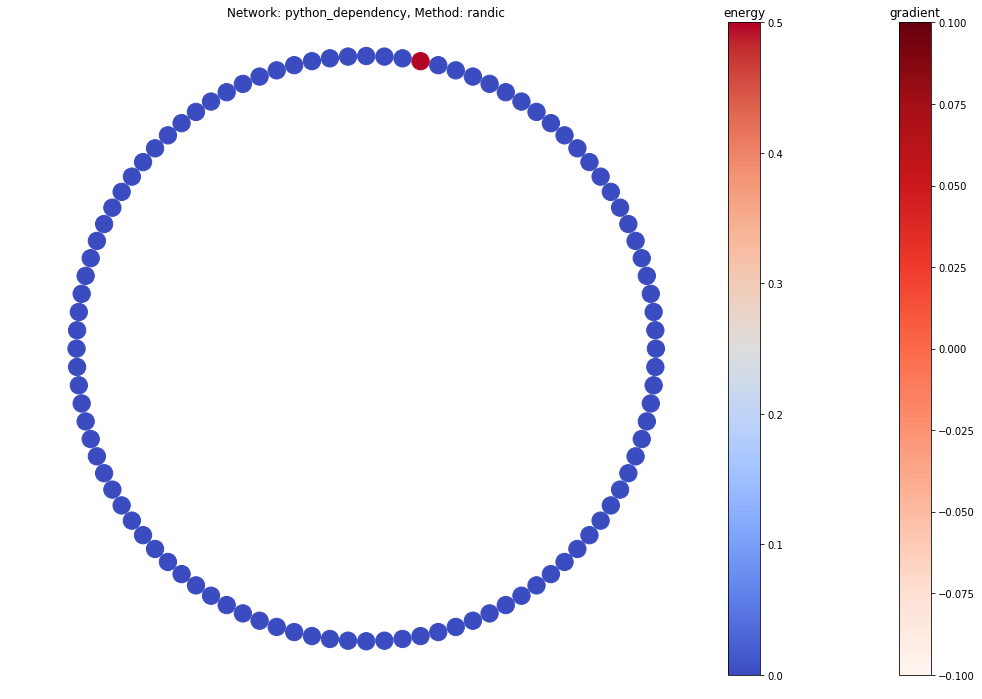

In [188]:
empirical_draw_network('python_dependency', 'randic', vstrategy='method+network')

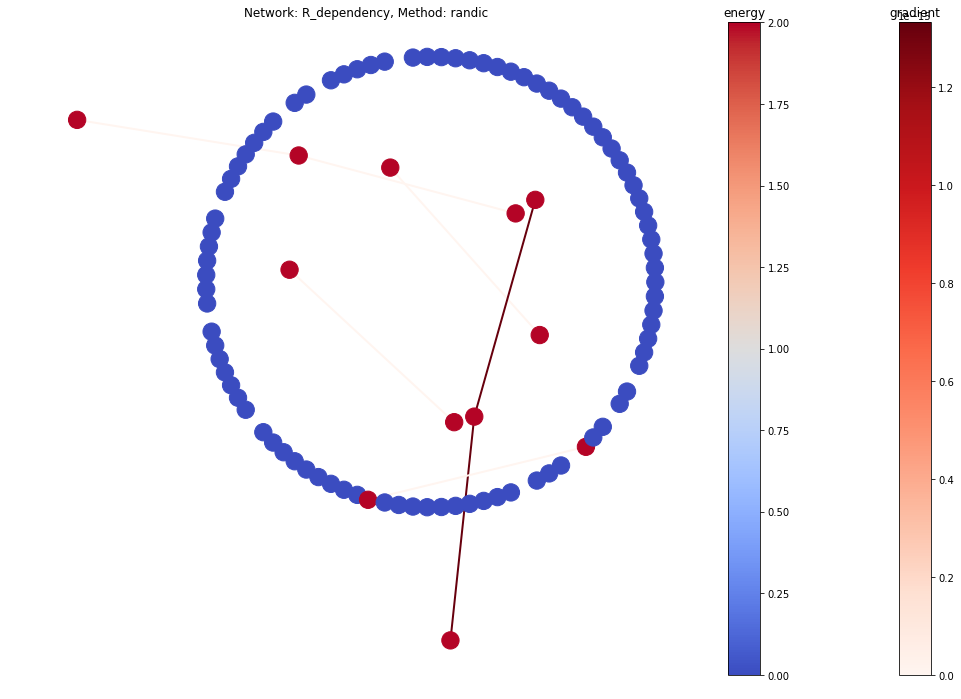

In [190]:
empirical_draw_network('R_dependency', 'randic', vstrategy='method+network')

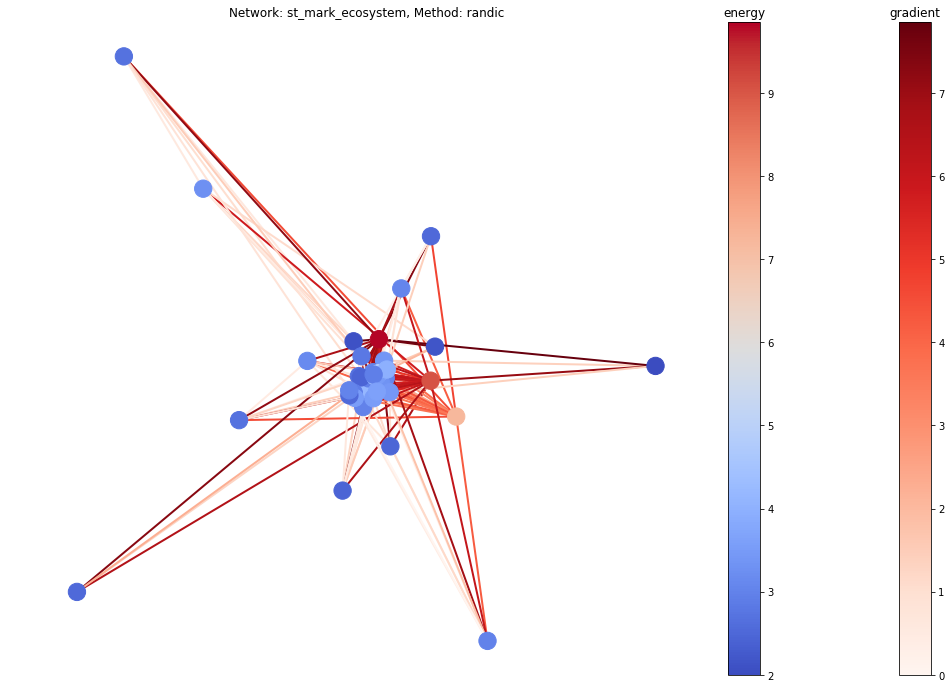

In [191]:
empirical_draw_network('st_mark_ecosystem', 'randic', vstrategy='method+network')

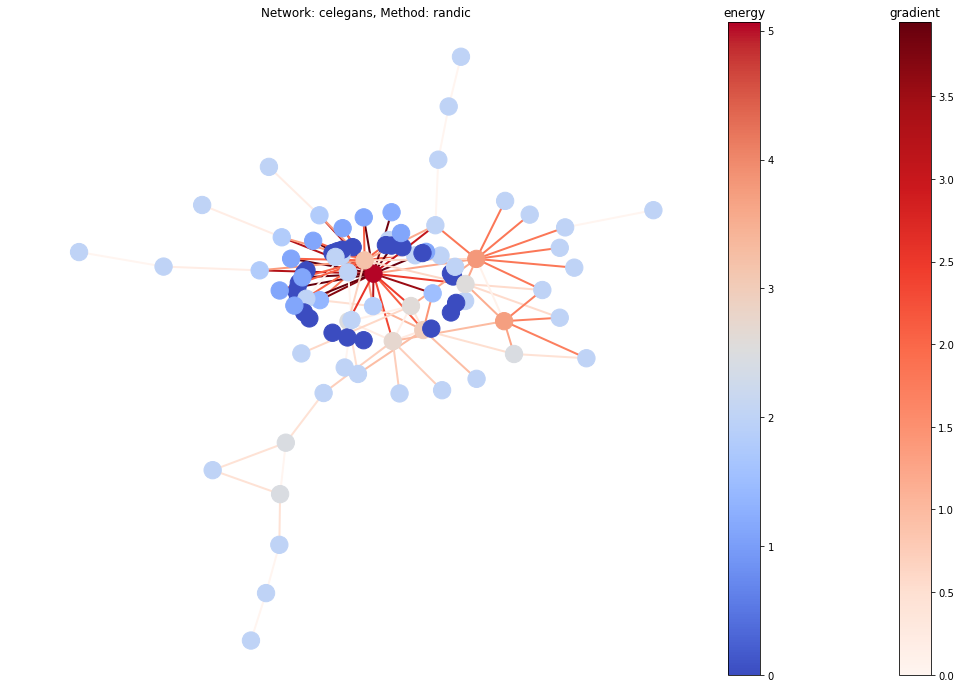

In [192]:
empirical_draw_network('celegans', 'randic', vstrategy='method+network')

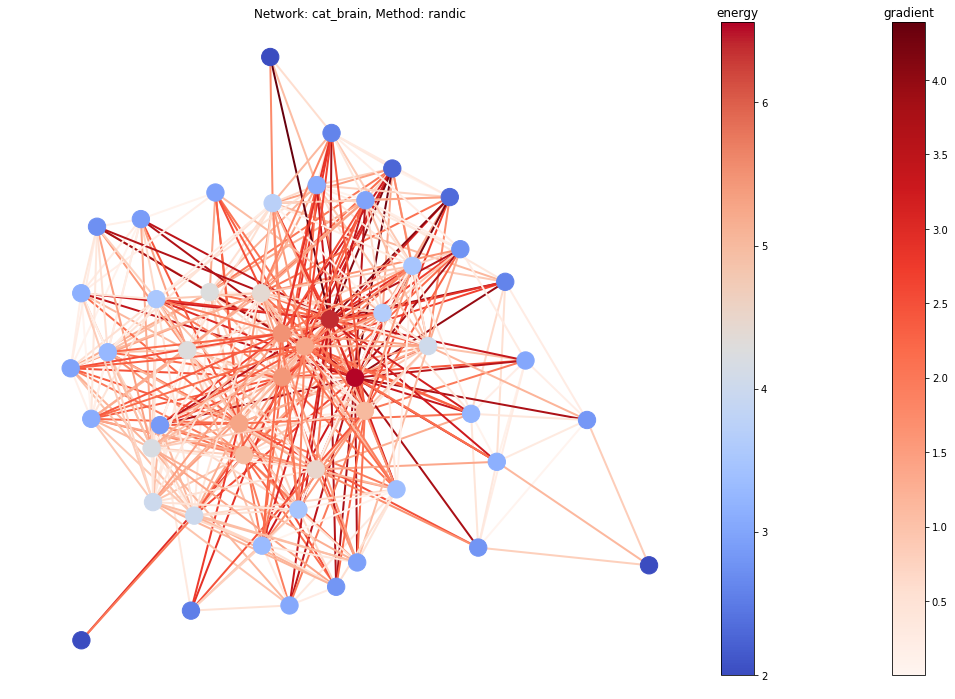

In [187]:
empirical_draw_network('cat_brain', 'randic', vstrategy='method+network')